In [1]:
import time
from fuzzywuzzy import fuzz

from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import NearestNeighbors
from sklearn.cluster import KMeans
from sklearn.feature_extraction.text import TfidfVectorizer,CountVectorizer
from sklearn.manifold import TSNE
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt
from gensim.models.word2vec import Word2Vec
from konlpy.tag import Okt
from konlpy.tag import Mecab
# from khaiii import KhaiiiApi
import numpy as np
from collections import Counter
import re
import networkx as nx

from wordcloud import WordCloud
from PIL import ImageFont, ImageDraw

import matplotlib.pyplot as plt

from matplotlib import font_manager
from konlpy.tag import Mecab
import warnings
warnings.simplefilter("ignore")

/opt/anaconda3/lib/python3.8/site-packages/fuzzywuzzy/fuzz.py:11: UserWarning: Using slow pure-python SequenceMatcher. Install python-Levenshtein to remove this warning
  warnings.warn('Using slow pure-python SequenceMatcher. Install python-Levenshtein to remove this warning')


In [2]:
# 재해개요 Data Load
# df = pd.read_excel("/Users/seop/Desktop/3-2/연구실/제조업 화재. 폭발사고 데이터(1.819건) (1).xlsx")
# df
df = pd.read_excel("fire_data.xlsx")
df

,연번,기준연월,발생형태_소,재해개요
0,43,201212,화재,주조사업장내 가우징 작업장에서 롤초크 안쪽에 붙어있는 소착을 제거하기 위해서 가우징...
1,120,201212,폭발·파열,[비보고 사유] 가스주입실에서 이송대기중 질소가스통 체결부위 불량으로 폭발되면서 파...
2,197,201212,폭발·파열,[비보고 사유] 재해 발생시 산업재해발생 보고를 해야 한다는 사실을 알지 못함 [조...
3,394,201212,폭발·파열,[비보고 사유] 재해자가 본인 실수로 다쳤으므로 본인이 알아서 한다고 하여 방치한 ...
4,478,201212,폭발·파열,[비보고 사유] 공상처리 [조사자 견해] 유성기업(주)에서 제출한 공상처리 내역 및...
...,...,...,...,...
1814,495010,201712,화재,상기일 상기인 호스를 연결하기 위해 녹이는 과정에서 사고가 발생.(신나에 불이 옮겨...
1815,495567,201712,화재,12월 07일 오전07시경 제품(무거리) 보관용기로 사용하기 위해 폐드럼통 뚜껑 산...
1816,495930,201712,폭발·파열,2017년 12월 12일 14시 48분경 회사 공장동에서 기계시운전을 하면서 온도상...
1817,496127,201712,화재,2017년 12월 18일 13시경 부산시 강서구 송정동 소재 부광화학공업(주) 본공...


In [3]:
# 중복 데이터 제거
df = df.drop_duplicates(['재해개요'], keep='first')
df

,연번,기준연월,발생형태_소,재해개요
0,43,201212,화재,주조사업장내 가우징 작업장에서 롤초크 안쪽에 붙어있는 소착을 제거하기 위해서 가우징...
1,120,201212,폭발·파열,[비보고 사유] 가스주입실에서 이송대기중 질소가스통 체결부위 불량으로 폭발되면서 파...
2,197,201212,폭발·파열,[비보고 사유] 재해 발생시 산업재해발생 보고를 해야 한다는 사실을 알지 못함 [조...
3,394,201212,폭발·파열,[비보고 사유] 재해자가 본인 실수로 다쳤으므로 본인이 알아서 한다고 하여 방치한 ...
4,478,201212,폭발·파열,[비보고 사유] 공상처리 [조사자 견해] 유성기업(주)에서 제출한 공상처리 내역 및...
...,...,...,...,...
1813,494817,201712,폭발·파열,사업장내 개발공실 옆 외부에서 민수 신호기 개발용 추진제 작업 중 고체추진제 홀 구...
1814,495010,201712,화재,상기일 상기인 호스를 연결하기 위해 녹이는 과정에서 사고가 발생.(신나에 불이 옮겨...
1815,495567,201712,화재,12월 07일 오전07시경 제품(무거리) 보관용기로 사용하기 위해 폐드럼통 뚜껑 산...
1816,495930,201712,폭발·파열,2017년 12월 12일 14시 48분경 회사 공장동에서 기계시운전을 하면서 온도상...


In [4]:
df_화재 = df[df["발생형태_소"] == "화재"]
df_폭파 = df[df["발생형태_소"] == "폭발·파열"]
화재_post = df_화재.get("재해개요")
폭파_post = df_폭파.get("재해개요")
폭파_post
df_화재

,연번,기준연월,발생형태_소,재해개요
0,43,201212,화재,주조사업장내 가우징 작업장에서 롤초크 안쪽에 붙어있는 소착을 제거하기 위해서 가우징...
5,636,201212,화재,[비보고 사유] 약 10일간의 입원치료로서 병원비를 회사에서 지급하였고 퇴원 후 조...
6,672,201212,화재,[비보고 사유] 개인 휴가중에 발생한 개인적 업무를 보다 발생한 사고라서 생각하여 ...
7,963,201212,화재,[비보고 사유] 이천만원 이하 공사인 관계로 산재처리 되지 않는다고 하여서 [조사자...
8,1388,201212,화재,[비보고 사유] 최초에 4일간의 통원치료 진단을 받았으나 가료 중 상처부위가 덧나 ...
...,...,...,...,...
1807,491279,201712,화재,2017. 11. 8. 14:40경 경기도 파주시 파주읍 정문로 720(부곡리497...
1810,493755,201712,화재,2017. 11. 22. 13:44.경 그라비아인쇄기 가동을 위한 준비작업을 하던더...
1814,495010,201712,화재,상기일 상기인 호스를 연결하기 위해 녹이는 과정에서 사고가 발생.(신나에 불이 옮겨...
1815,495567,201712,화재,12월 07일 오전07시경 제품(무거리) 보관용기로 사용하기 위해 폐드럼통 뚜껑 산...


In [5]:
화재_post = 화재_post.reset_index().drop('index',axis=1)
폭파_post = 폭파_post.reset_index().drop('index',axis=1)

In [6]:
화재_post

,재해개요
0,주조사업장내 가우징 작업장에서 롤초크 안쪽에 붙어있는 소착을 제거하기 위해서 가우징...
1,[비보고 사유] 약 10일간의 입원치료로서 병원비를 회사에서 지급하였고 퇴원 후 조...
2,[비보고 사유] 개인 휴가중에 발생한 개인적 업무를 보다 발생한 사고라서 생각하여 ...
3,[비보고 사유] 이천만원 이하 공사인 관계로 산재처리 되지 않는다고 하여서 [조사자...
4,[비보고 사유] 최초에 4일간의 통원치료 진단을 받았으나 가료 중 상처부위가 덧나 ...
...,...
935,2017. 11. 8. 14:40경 경기도 파주시 파주읍 정문로 720(부곡리497...
936,2017. 11. 22. 13:44.경 그라비아인쇄기 가동을 위한 준비작업을 하던더...
937,상기일 상기인 호스를 연결하기 위해 녹이는 과정에서 사고가 발생.(신나에 불이 옮겨...
938,12월 07일 오전07시경 제품(무거리) 보관용기로 사용하기 위해 폐드럼통 뚜껑 산...


In [7]:
# 불용어 정의
df_stopwords = pd.read_excel('stopwords.xlsx')
df_stopwords

,불용어
0,아
1,휴
2,아이구
3,아이쿠
4,아이고
...,...
1144,이용
1145,직원
1146,외부
1147,중


# 화재에 대한 네트워크 시각화

In [8]:
# 명사부분 추출
sentence_list = []
morphs_list = []

tagger = Mecab()
sentence_nouns_list = []
for post in 화재_post['재해개요']:
    print(post)
    morphs_value = []
    for noun in tagger.nouns(post):
        if noun not in list(df_stopwords.get("불용어")):
            if len(noun) == 1:
                    noun = noun+'_'
            morphs_list.append(noun)

            morphs_value.append(noun)
    sentence_nouns_list.append(morphs_value)

주조사업장내 가우징 작업장에서 롤초크 안쪽에 붙어있는 소착을 제거하기 위해서 가우징 기계를 이용하여 작업하던 중 가우징 불똥이 내경 단차부위에 두딪혀 작업자 쪽으로 뛰어 점퍼에 불이 붙었으나, 방독마스크와 용접면을 쓰고 있어서 불이 붙은 줄 모르다가 늦게 인지하여 왼쪽팔과 가슴쪽에 화염화상을 입음.
[비보고 사유] 약 10일간의 입원치료로서 병원비를 회사에서 지급하였고 퇴원 후 조속히 업무에 복귀함에 따라 별다른 생각없이 보고하지 아니 함. [조사자 견해] 관련지침 및 감독관집무규정에 따라 경고조치코자 함 [작업장소] 위 사업장내 PET생산라인 현장에서 [작업목적] 수지게이트 노즐구멍을 오픈하기 위해 [작업도구] 휴대용 토치를 사용 [작업내용] 토치가 기계모서리에 찍히면서 [재해사유] 원재료에 불이 붙어 [재해발생] 팔목과 팔꿈치 사이에 화상을 입음
[비보고 사유] 개인 휴가중에 발생한 개인적 업무를 보다 발생한 사고라서 생각하여 산재처리를 하지 않음  [조사자 견해] 산재처리 여부 확인서, 재해자의 사유서,산업재해조사표 및 재해자 진단서 등에 의거 고의성이 없는 것으로 판단되고, 2011.5.19. 이전 조치기준에 의거 요양기준이 84일 미만이고 최근 3년 이내에 동일 사안 위반내역이 없으므로 이번에 한해 경고처분으로 종결코자 함 [작업장소] 2010년 6월29일 김천 구성면 소재 냇가에서 [작업목적] 고기를 굽기위해 [작업도구] LPG 가스기기에  [작업내용] 점화하는 순간 [재해사유] 가스 호스의 연결상태가 느슨하여 빠지면서 호스애 [재해발생] 불이 붙어서 화상을 입음
[비보고 사유] 이천만원 이하 공사인 관계로 산재처리 되지 않는다고 하여서 [조사자 견해] 산재처리여부 확인서, 진단서 등에 확인한 바, 고의성이 없는 것으로 판단되고 2011. 5.19. 조치기준에 의거 요양기간이 84일 미만이고 최근 3년내 동일 사안 위반내역이 없으므로 이번에 한래 경고처분으로 종결코자 함 [작업장소] 2010.9.17 16:30분 경 (주)NPK 공사현장에서  [작업

2012.05.29 07시30분경 현장에 들어와 지기 담당기계(미선)에 까스 점화를 하기 위하여 
까스 점화를 하기 위하여 까스 메인 밸브를 열고 즉시 불응 붙여야 되는데 순간 깜박하여 
몇십초 늦게 점화하는 과정에서 유출된 가스에 불이 붙여 일어남 사고임.
2012.6.1.15.00분경 개선람다 RH보강 용접하는 장소와 평면도 측정기 중간지점에서 타각기사용 잉크 보관용 비커(플라스틱 소재)에 불이 붙은 것을 김명동 사원이 발견하여 불을 끄려고 비커를 장갑을 착용한 상태로 잡았으나 장갑에 불이 붙어 장갑을 벗는 사이에 이우찬씨가 그 비커를 장갑을 낀 채로 손으로 불을 끄려고 하였으나 장갑에 불이 옮겨 붙어 장갑을 벗으려고 하였으나 비커가 이미 녹아 장갑에 불이 붙어서 잘 벗겨지지 않아 손을 흔드는 과정에서 비커 안에 들어 있던 내용물(인화성물질)이 몸에 쏟아지면서 내용물이 묻은 부분에 불이 붙어서 좌측 얼굴과 팔 가슴쪽에 화상을 입음.
6월1 보호용 테이를 생산이던중 정전기로 인해 화재가나 소화를 하는 과정에 바지에 불이 붙어 양다리와 양손에 화상을 입었음.
원인 미상의 화재에 의한 전신 화상
공장내 열처리 공정인 곡로안에서 다른 제품을 하기 위하여 열선 재정비 작업중 소형부탄가스통을 작업후 곡로안에 내려놓고 작업도중에 균열이 있던(원인미상) 부탄통에서 누설된 가스가 점화되어 피해자와 접촉 화상을 입음.
6월 11일 누전으로 화재 발생해 화상
본인은 동신직물 제직기사로 근무하던중 2012년6월14일 02시경 야간근무중 원단 결점을 확인하기위한 과정으로 제직 현장에서 쌤플을 채취하여 뜨거운 물에 삶은후 염료를 주입하여 간이 염색을 하기위해 회사내에 위치한 구내식당(취사는 하지않음)으로가서 가스렌지에 불을 붙이는 순간 가스 누출로 인해 새어나온 가스에 불이붙어 하반신에 화상을 입게 되었음.
2012년 6월14일 오후4시경에 신선철강 현장에서 산소일을 하다가 산소호스가 터져 LPG 가스가 새어나와 불이붙어 왼쪽 종아리를 화상 당했음.
당사 포장실 혼합기계중 가루형태

2012년 10월 26일 10시 50분경 25BL' A 조립장에서 가조립된 북항대교 공사용 교량박스 내부 교정작업을 하기 위하여 재해자(이석식)가 교량박스환기구로 교정용 토치를 넣는 과정에서 교정용 토치 밸브가 열려 가스가 누출되었으나, 교량박스 내부로 들어간 재해자(이석식)가 교정용 토치에 불을 붙이는 순간 박스내부에 불이나서 화상을 입은 사고임.
충남 보령시 청소면 소재 ㈜함라 지붕재 생산 공정의 코팅공정에서 작업을 마치고 망인이 코팅기 하부 지하공간에 들어가서 펌프 회전축에 누출된 아스팔트 고형물을 제거하던 중 화재가 발생하여 현장에서 사망한 재해임
2012년 10월29일 09:10경 후란 소구경 작업장에서 중자 도형제 작업후 중자 건조를 위해 도형제에 불을 붙이자 불이 도형제로 오염된 작업복으로 번져 왼쪽 종아리에 화상을 입음.
2012년 11월 5일 09:40분경 조립부서 설비파트에서 설비세척하는 플라스틱 통에 알코올과 신나를 옮겨 담는도중 플라스틱통에 구멍을 잘못 뚫어서 알코올이 바닥에 조금 흘렀고, 흘린 알코올을 닦고 있는데 알코올 ?고 있는데 알코올이 계속 세어서 플라스틱통의 구멍을 막으려고 전기실리콘을 사용해서 구멍을 막으려는 도중 실리콘 똥이 바닥에 떨어지면서 불이 났고, 팔 다리에 불이 붙었습니다. 그후 강동병원으로 가서 응급 조치후 화상 전문 병원인 대구 광개토병원으로 이송후 입원치료를 받고 있습니다
기계에서 불꽃이 튀어 바닥에 불이 붙어 발로 밟아 끄는 중 바지에 불이 붙어 화상을 입음.
제품 포장작업 확인차 외근 나갔다가 사고를 당함
(거래처 화성 남양 LTP 코리아 회사 작업확인차 외근을 나갔다가 원인모를 정전기 발생으로 화재가 나 사고가 발생함)
2012년 11월 15일 목요일 오후에 생산 현장 가스 저장소에서 산소 가스통 교환 작업시 가스 호수가 터져서 압력과 함께 화기 발생하여 작업복에 불이 붙어 응급조치 후 119 구급차에 의해 이천의료원 이송 하고 다시 화상전문센터인 구로성심병원으로 후성 치료 중입니다.
2012년 11월 1

2013년7월24일오후16:30분경 삼천포소재 HK조선소 내 선박 건조중 절단작업을 하다 작업복에 불이 붙어 일어난 사고임.
07월 25일 14시경 나성산업 현장에서 코팅작업을 하던중 잉크 코팅작업상 잉크를 잉크사라에 바가지로 지로 퍼서 부던중 뒤쪽 전선에서 누전으로 인한 스파크로 인하여 화재발생으로 오른쪽 얼굴과 오른팔 화상을 입었습니다.
상기 본인은 2013년 7월 26일 09시경 당해사업장에서 철구조물을 용접하면서 용접 불꽃이 상의 옷에 옮겨 붙으면서 상복부 전면과 후면에 2도 및 3도 화상을 입었음
2013. 7. 27. 05:50경 군산 동양 TS 공장에서 열교환기 용접 작업을 하다가 작업복에 불이 붙어 오른쪽 팔에 화상을 입은 사고입니다.
2013년 7월28일 새벽2시경 야근중이던 미얀마 근로자 테이로부터 함께 근무중이던 운튜라가 화상을 입었고 보명광업직원 이재섭씨가 인근 고려병원으로 이송했다는 전화를 받았다 환자의 상태가 위중하여 다시 조대응급실에서 응급치료 후 하남성심병원에서 입원치료를 받게 하였다 정확한 의사소통이 되지 않는 관계로 환자를 입원 조치시키고 사고 내용 파악을 위해 공장내 CCTV를 확인해 보왔다 사고의 내용은 야식을 먹고 휴식중이던 새벽1시 40분경 환자 운튜라외 다른 외국인이 잠깐 잠이 들었고 그사이 공장내에서 과부하로 인한 화재가 발생하였다 화재진압하는 광정에서 화상을 입게 되었다
2013년 7월 29일 16시 인천동구 화수동에 소재한 DH조선 현장에서 예인선 건조를 위한 과정 중 선박의 앞부분에 선박 정박시 사용되는 앵카를 설치하고 사용하게 되는데 선박의 선수에 앙카에서 사용되는 체인을 보관하는 격실 산박용어로는 체인로커가 있는데 체인 보관격실에 체인을 적재하는 과정중 체인을 고정하기 위하여 격실내부에 기 설치된 샤클이 체인 투입을 방해하게되어 이를 절단하기 위하여 절단기의 벨브를 여는 순간 기존재한 유증기 발생으로 화기가 발생하여 옷에 불이 붙어 소화하였으나 화기발생 시 사고자의 전면부에 화상을 입어 인하대병원에서 응급조치

2014.03.27 쓰던 발효실이 고장이 나서 임시방편으로 발효실안에 휴대용가스버너를 넣고 물을 끓여 생기는 수증기로 빵을 발표시키고 있었음 점심시간이 끝나고 14:50경 일을 시작하기 위해 발효실로 갔는데 가스냄새가 너무 심해 가스버너를 확인해 보았더니 가스새는 소리와 함께 불이 꺼져 있었음, 더이상 가스가 새는것을 방지하기 위해 가스버너 레버를 반대로 돌리는 순간 펑하는 소리와 함께 화기가 올라와 119신고해 구급차를 타고 바로 삼선병원으로 갔다가 백병원으로 치료받았음
2014년 03월 30일(일) 18:20경 생산A동 3층 R-702 반응기 실에서 김형진 사원(신입사원)이 R-702반응기에 체결된 연결관과 고리를 분리하는 과정에서 스파크가 발생하였고 당황하여 김형진 사원이 뒷걸음 치면서 THF용매 700ML가 담겨진 스테인레스통을 발로 넘어뜨려 화재가 발생하면서 김형진사원의 바지에 불이 붙은 사고가 발생함.
2014년 4월 2일 11시경 PS(원자재) 건조기 화재로 인하여 출구 개폐와 동시에 화마가 전신을 휘감았다
그리하여 동료가 화재를 진화하고 119에 의하여 후송됨
상기본인은 2014년 4월 15일 오전10시반쯤 작업장에서 레들받침대가 있는곳에서, 레들 보수하기위해
메탄올을 뿌리다 오른쪽다리로 불이 붙어 화상재해를 입게 됨.
재해자는 2014년4월21일 16;00시경 5도크 2657호선 1번 탱크 DECK 상부 D18 X 19(S) 쪽에서 화재가 발생하여 대피하는 도중 족장 사이에 발이 빠져 넘어지면서 좌측 다리에 타박상을 입은 사고임.
2014년 4월 21일(월) 15시 20분경 울산시 동구 소재 현대중공업(주) 5도크 2657호선(LPG선) 1번 홀더(hold)내에서 에이치케이엔지니링(주) 소속근로자 망 ‘김형섭’ 등 21명이 선박 블록 용접작업 및 검사작업 중 용단 불똥이 탱크 하부로 떨어지면서 LPG탱크 외벽의 보온재(폴리우레탄)에 발화되어 화재가 발생하여 김형섭이 화재로 인하여 사망한 재해임.
휠로더(DL420A 397호기)생산완료 후 19시

철판 열처리중 산소호수가 빠지면서 호수 끝에 불이 붙었고, 그 호수 끝이 얼굴을 치면서 화상을 입음.
2014년 09월 23일 오전 11경 경북 김천시 개령면 소재의 페인트 제조 공장에서 톨루엔을 이용하여 지하탱크에서 1층 믹서기로 연결된 배관에 쌓인 슬러지 제거작업을 하던 중 찌꺼기를 담아놓은 드럼에 스파크가 일어나면서 화재가 시작되었습니다. 당시 배관에서 드럼통에 슬러지를 담는 작업을 하던 중 유증기에 불이 붙어 얼굴 등 몸에 화상과 연기 흡입으로 인한 치료를 받기위해 2014년 09월 23일  오전 11시경 119에서 출동한 앰블런스를 타고 경북 김천시 신음동 소재의 김천의료원에서 응급치료를 받은 뒤 화상전문병원인 대구광역시 중구 태평로 소재의 푸른 병원에서 치료를 받게 되었습니다.
2014년 9월 23일 오전 11시경 경북 김천시 개령면 페이트 제조 공장에서 톨루엔 이용 지하탱크에서 1층 믹서기로 연결된 배관에 쌓인 슬러지 제거작업중 찌꺼기를 담아놓은 드럼에 스파크가 일어나면서 화재발생. 당시 주변 정리중 팔에 화상과 연기 흡입으로 치료 받기 위해 2014년 9월 23일 오전 11시 30분 119엠블런스 타고 김천시 모암동 소재의 김천의료원에서 응급조치 받았다
2014년 9월 23일 오전11시경 경북 김천시 개령면 소재의 페이트제조 공장에서 톨루엔을 이용하여 지하탱크에서 1층 믹서기로 연결된 배관에 쌓인 슬러지 제거작업을 하던 중 찌꺼기를 담아놓은 드럼에 스파크가 일어나면서 화재가 시작 되었습니다. 당시 주변에서 공구 및 기타정리작업을 하던중 팔과 귀주위에 화상과 연기흡입으로 인한 치료를 받기 위하여 2014년9월23일 오전11시30분경 119에서 출동한 엠블런스를 타고 경북 김천시 모암동 소재의 김천의료원에서 치료를 받게 되었습니다.
2014년 9월 23일 오전 11시경 경북 김천시 개령면 소재의 페인트제조 공장에서 톨루엔을 이용하여 지하탱크에서 1층믹서기로 연결된 배관에 쌓인 슬러지 제거작업을 하던중 찌꺼기를 담아놓은 드럼에 스파크가 일어나면서 화재

2014.12.10. 오후 18시경 을지로 3가 경일인쇄현장에서 압통수리 보수 작업중 촛농을 녹여서 압통에 붙이는 작업중 촛불이 벤졸걸레에 불이 옮겨가면서 오른쪽 다리 부분에 화상을 입음.
차량 해체 작업중 lpg 차량에서 lpg 가스가 누출된 사실을 확인하지 못하고 차량 절단용 산소절단기를 사용하다가 산소 절단기의 불꽃이 누출된 lpg가스에 튀면서 화재가 발생하였습니다. 순식간에 번진 화재로 인하여 안성모 사원이 화상을 입었고 공장 일부가 화재로 소실 되었습니다. 안성모 사원은 즉시 동료 차량으로 병원 이송 하였고 화재는 소방서 차량에 의해 진화 되었습니다.
2014년12월14일 00:00경 공장 원료(수피)야적장에서 화재가 발생하여 기숙사에서 근무하던 근무자들이
화재진압을 위해 작업을 실시함, 이과정에서 당사자는 소화기를 가지고 달려가다가 원료(수피)야적장 부근에서 미끄러져 골절을 당함, 즉시 현재 입원중인 병원으로 동료들이 이송 하였읍니다.
이성구(환자)씨는 자사 근무중 옆건물 화재 발생으로 인하여 자사 건물에 불이 옮겨온 화재로 인하여 화상을 입게 되었습니다.
2014년 12월 17일 오전 9시 30분경 옆(태영테크)에서 화재발생하여 연기로 인한 출입구대피 늦어 유독가스흡입 후 2층 사무실창문에서 판넬지붕위로 사장님 지시하에 같이 뛰어내렸으나 몸을 움직일 수 없어 옆공장 지게차로 구출 후 심한통증으로 119구급차로 길병원 응급실 방문, X-ray  및 유해가스, 응급치료받은 후 인천기독병원으로 후송 후 입원치료 받고 있음
2014년 12월 27일 03시경 당사 근로자 운뚱(UNTUNG)씨가 야간작업중 교반 2호기에서 수지3포를 투입한 후 송진과 BHT를 투입하는 과정에서 정전기로 인하여 화재가 발생하여 작업자의 이마, 턱 및 양손목 부위를 데인 사고인데 근로자 본인과 회사의 요구에 의해 전원하고자 합니다.
2014년 12월 31일 19:00경 야간작업중 나염기 옆 텐타에서 화재발생함. 원단에 불이 붙어 텐타위 올라가 소화기로 유리를 깨고 진화하다 미끄러

(박인조: 회사 차량으로 고성군 소재 강병원으로 이송, 응급처치후에 부산 사하구 소재 하나병원(화상전문병원)으로 이송되었음.)
2015년 6월 11일 09시 30분경 계양구 서운동 128-18 안성산업 사업장 내에서 생산제품을 용접하던 중 재해자 한상석의 등 뒤에 에어컨과 벽 사이에 비닐포장에 불이 붙어서 화재진압을 하려는데 사장님께서 앞에서 먼저 불을 제거한 후 비닐포장을 당기는 바람에 등 뒤에서 비닐에 불씨가 얼굴에 튀어 화상을 당하였습니다.
재해자가 2015년06월11일 16:30분경 한국고벨(주)제3공장에서 크레인사상작업중 공기공급작업복을 입고 사상작업하면서 공기공급라인이 아닌 산소공급라인에 잭을 연결하여 작업하는 바람에 사상작업중 발생하는 불꽃에 의해 작업복내부에 공급되던 산소에 발화되어 등.엉덩이.얼굴부위에 화상을 입는 재해가 발생됨
상기일 도장공장 1층 옥외도장 개선반에서 이동식 발판 drail. hole 천공작업을 위해 산소/아세틸렌 절단기 준비 후 토오치에 불을 붙이는 순간 토오치와 아세틸렌 호스 연결 부위가 빠지면서 화염이 발생되어 재해자의 도장복 하의 우측 발목/손목 부분에 불이 붙어 화상(우측 발목, 팔, 얼굴)이 발생함.
2015년 6월 18일 14시경 경남 함안군 법수면 소재 승화중공업 옥외 작업장에서 용접을 하던중 용접 불꽃이 바람에 날려 옷에 불이 붙으면서 옆구리와 등에 화상을 입었습니다.
재해자 밧수리는 중자 도형작업중(도형봇 사용) 1차 도형후 건조시키고 거조시킬때 남은 미세한 잔불을 인식하지 못한채 2차 도형작업 순간 도형제가 왼팔 소매로 튀어 순식간에 불이 번져 당황한 나머지 뛰다가 넘어져 발목부상 및 화상을 입은 재해임.
작업장내에서 형틀에 도형제(알콜희석제 함유)를 붓으로 도포하던 중 옆에 있는 형틀에 팔이 살짝 부?혀 도형제가 담긴 그릇의 도형제가 작업복과 안전화에 조금 쏟기면서 그릇에 있던 붓이 땅에 떨어지면서 붓에 불이 붙어 이것을 발로 끄려다가 안전화, 작업복에 불이 옮겨 붙어 일어난 사고로 즉시 병원으로 이송 조

상의에 마찰로 인해서 얼굴과 팔에 화상입음(페인트 작업 중 신나에서 불이 붙어 옮겨진 것으로 재해자 확인).
망인은 2015. 7. 1. 사업장에 공무담당자로 취업하여 공장내 시설물 또는 전기 관련 수리업무를 수행하던 중 2015. 11. 30. 17:00 공장내 생산물의 부산품을 모아놓는 집진기탱크에서 용접기를 사용하여 부산물을 제거하는 작업을 수행하다가 화재가 발생하여 전신 3도화염화상을 입고 병원에서 치료 중 다발성 장기부전을 원인으로 하여 사망하는 재해가 발생함
2015년 12월 11일 10시10분경 논산시 가야곡면 목곡리 소재 (주)사스틸 사업장내에서

 산소절단작업을 하던중 산소불꽃이 옷으로 옮겨붙으면서 고환 및 다리에 화상을 입음.
경남 김해시 상동면 동북로 437번길 83-43 대광화공의 작업공실내에서 원료혼합작업을 하던 중 혼합기계에 결함이 발생하여 화재가 발생하였고 이로인해 화상을 입게됨.
경남 김해시 상동면 동북로 437번길 83-43 대광화공의 작업공실내에서 원료혼합작업을 하던 중
혼합기계에 결함이 발생하여 화재가 발생하엿고 이로인해 화상을 입게 됨.
2015년 12월 15일 오전 08시 30분경 벤치3 밧데리 작업장에서 재해자 권영춘 사원은 적층공정중 제품금형에 수지를 입히고 고온 드라이기로 건조시키는 과정에서 고열에 의해 제품에 불이 붙어 순간적으로 발로 밟아서 끌려다 불이 붙은 제품이 바닥에 있던 세척용기로 옮겨 붙으면서 화재가 확산되었고, 이 과정에서 다리, 팔, 얼굴에 화상을 당하는 안전사고가 발생하였음.
상기인 상기일 회사작업장 내에서 가설난로에 나무를 넣고 점화하려하는데 불이 붙지 않아 기름을 난로통에 붓자 폭발하여 상체 전부(얼굴,머리)포함 화상을 입어 119 불러서 한강 성심병원에 입원함.
상기인 상기일 일일업무 진행사항으로 진공펌프 응고된 유분을 가열에 의한 흐름성을 확보하고자 토치로 외벽을 가열하여 내부에 있는 유분을 제거하는 과정에서 진공펌프 내 가열된 가스가 팽창하면서 하부 밸브에 불이 붙어 잠그러 다가가는 순간 화

2016년 6월 1일 11:00경 포천 에어뷰라는 회사에서 냉동기 실외기 콤프레셔 교체 작업중 콤프레셔 내부 기름에 불이 붙어 상해를 입음.
2016.06.02. 09:50경 대신폐차산업(주) 사업장에서 폐차 전 자동차의 연료통 분해작업중, 연료통에서 휘발류를 기름통(20L)에 붓기위해 깔대기를 이용하여 작업중 작업자 옷과 깔대기의 기름망(부직포)에서 갑자기 정전기 비슷한 스파크가 튀면서 유증기에 의해 화재가 발생, 옷전체 퍼져 화상을 입음.
신청인은 년 6월 3일 AM 10:00경 충청남도 금산군에 소재한 (주)태화켐의 사업장에서 작업 중 갑자기 화재가 발생하여 안면, 팔, 몸 등 전신에 화상을 입어 사건 당일 회사관계자의 차량으로 대전광역시 동구에 소재한 베스티안 우송병원으로 후송되어 응급치료를 받고 입원(34일) 및 통원 치료 중에 있습니다.
상기일 상기인 제품생산중 용해로의 거품을 이동대차에 담아 완전히 식은 다음에 대차를 옮겨야 하나 상기인은 무리하게 이동대차를 옮기는 과정에서 대차가 바닥의 2.3t 두께의 철판에 걸리면서 대차의 알루미늄거품이 신발과 바지에 떨어지면서 불이 점화되어 화상사고가 발생되었음.

**의무기록지 파일로 첨부.
2016년 6월 8일 10시 5분경 (주)한국철도차량엔지니어링 제천사업소 대차작업장에서 산소용접이 끝난후 볼수타 도색작업중도색작업자 이준호가 볼스타 데브레바 부싱이 탈출한 것을 발견하고 용접작업자 오규환에게 부싱이 탈출한 것을 알려주어 오규환이 부싱을 용접하던 중 용접 불꽃이 옆에 놓이 페인트통으로 튀면서 화재가 발생하였고, 당황한 오규환이 페인트통을 버리려고 들고 뛰어나가는 과정에서 우측팔, 엉덩이, 옆구리에 화상을 입게 되었음.
B01C B#1702 UPPER STOOL 취부(절단)작업중 누출된 AIR로 부터 발화되어 불기둥이 형성, 재해자의 옷과 몸속의 AIR호스 (AIR자켓대용)에 불이 붙어 전신화상을 입게된 사고임.
상기일 상기인 철판코팅재(316L)사용중 자연발화로 인하여 화상.
2016년06월13일 월요일 

상기일 상기인 타근무자가 파라핀, 송진을 7:3의 비율로 2p주전자에 넣고 부스터 위에 녹여 사용후 퇴근, 50ml 정도의 잔여분이 가열점화되어 확인 후 7m 정도 이동 물로 소화과정에서 불꽃의 확장으로 재해가 발생함.

*급여자료 및 의무기록지 파일로 첨부.
2016년 11얼 8일 14시 15분경 (주)팩슨 나동 아세틸렌 생산장 내 가스 생산중 정제기 내 원인을 알수없는 폭발사고로 화재가 발생하였음. 작업중이던 나은덕씨가 화상을 입고 병원으로 이송됨.
16.11.11 오전 10시경 경남 밀양 (주)미정산업 공장내에서 기계설치 작업(용접)을 하는 과정에 화재가 발생하여 기계에서 떨어지면서 부상.
2016.11.15 08시 30분 LG전자 창원 1공장 B동 CEM 창원생산팀 PM룸 내부에서 재해자(전병혁반장)가 분진 개선작업을 위해 분진받이를 임의로 제작하는 과정에서 핸드 그라인더 작업 중 화재가 발생, 분진받이(시료)가 전도되며 발목 골절 및 신체 일부 화상을 입음
2016년 11.24(목) 13시 40분경 이영산업기계(주) 이진공장 대조립 D라인에서 작업중인 2800 F23A선미 하부 사상작업중 상부에서 떨어진 용접 불꽃이 에어자켓 내부로 떨어져 피복이 전소하여 화재가 발생하여 화상을 입은 재해임. 
(화재 발생후 소화기로 진압후 울산대학병원으로 이송하여 응급처치후 2차 치료를 위해 부산 하나병원으로 후송함)
2016년 11월 26일 16시경 황인철 본인이 난로 점검차 난로의 덥게를 여는 순간 갑작스런 불의 역류로 인해 안면부 및 팔부위에 화상을 입은사고입니다.
충북 제천시 강제동 248-3 번지 소재 공장내부애서 성형작업준비중 고압탱크 압력으로 인하여 경화제(원재료) 호수가 이탈되면서 신체에 분사 되고 인근에 있던 전기난로의 열기로 인한 발화로서 화상사고 발생
충북제천시 강제동 248-3번지 소재 공장내에서 성형작업준비중 고압탱크 압력으로 인하여 경화제(원재료)호수가 이탈되면서 신체에 분사되고 주변에 있던 전기난로의 열기로 인한 발화로서 화상사고 발생.
상

2017년 06월 28일 22시 45분경 동료 작업자 김경태와 작업장내 C동 COLUMN 용접작업중 다른 작업을 위해 작업위치 이동하여 용접작업을 하려는 순간 용접비산이 튀면서 용접자켓 내부에 둘른 에어자켓이 불이 붙으면서 가슴 부위에 화상을 입은 재해임.
2017.6.28. 11:30 경 한국유화 작업 현장에서 용제(솔벤트 2호)펌프 작업 중 스파크 발생으로 재해자가 오른쪽 팔과 더리에 튀어 화상을 입음. 곧바로 소화기로 진압하고 119에 신고 구급차량으로 성모병원 이송함.
2017.7.10.09:40경 재해자가 집합체 조립대를  청소하는 과정에서 화재방지를 위해 사용되는 습식 청소기의 수거통을 수시로 비우고 물을 채워야하나 사고 당시 물이 부족하여 화재가 발생함.
공장내에서 철자재 산소절단을 하기위해 분리되어있는 호수를 산소와 LPG에 연결하여 산소 절단기를 드는 순간 주위에 화재가 발생하여 오른쪽 겨드랑이 부위인 갈비뼈 쪽과 팔부위에 화상을 입은 사고입니다.
자동차 부품 사상 작업중(페파그라인더) 불꽃으로 인하여 앞치마에 묻어있는 가루에 의하여 화재가 발생하여서 화상을 입었습니다.
2017년 07월 21일 11시00분경 경북 경산 진량읍 문천길 161-10 소재 병주농자재 사업장내에서 위 근로자 조도연은 비닐하우스 보수용 테이프 생산작업 공정과정에서 배면기계에서 원인을 알수 없는 화재가 발생한 것을 발견하여 소화기를 이용하여 화재진압 도중 옷에 불이 옮겨 붙음으로 인하여 오른팔과 다리에 화상을 입어 119구조. 구급에 의해 병원으로 후송하여 치료가료 중입니다.
2017.08.01.연료모터 테스트 과정중 쏘트로 인하여 화재가 발생됨.
2017년 8월 3일 13시35분경 당사 남양테크에 근무중인 김판돌은 경남양산시주남로 98번지 소재(주)세화사의 거래요청으로 현지 세화사출장공사(집진설비 앙카볼트 절단제거작업)중 남양케크에서 준비하고 간 산소 절단기 호스가 터지면서 화재발생으로 인한 화상 재해 발생.
상기 재해일시에 상기사업장 내에서 차체 분해 도중 과열로 인

In [9]:
# 가장많이 나오는 명사 상위 20개
from collections import Counter
num_top_nouns = 200
nouns_counter = Counter(morphs_list)
top_nouns = dict(nouns_counter.most_common(num_top_nouns)[:200])
top_nouns
# print(len(counted_nouns))

{'화상': 668,
 '분경': 301,
 '용접': 233,
 '산소': 197,
 '소재': 156,
 '옷_': 142,
 '불꽃': 139,
 '가스': 126,
 '절단': 120,
 '현장': 114,
 '호스': 110,
 '치료': 106,
 '기계': 98,
 '스파크': 97,
 '작업복': 91,
 '상기': 88,
 '진압': 84,
 '바닥': 76,
 '바지': 71,
 '부위': 68,
 '절단기': 67,
 '전기': 67,
 '진화': 66,
 '회사': 65,
 '발화': 65,
 '제품': 64,
 '장갑': 64,
 '제거': 62,
 '장내': 60,
 '연결': 60,
 '상태': 60,
 '소화기': 60,
 '탱크': 60,
 '차량': 59,
 '신나': 58,
 '라인': 56,
 '공정': 52,
 '정전기': 47,
 '페인트': 47,
 '청소': 46,
 '근무': 45,
 '사업': 44,
 '배관': 44,
 '후송': 44,
 '연료': 43,
 '시경': 43,
 '대피': 42,
 '난로': 41,
 '불길': 39,
 '수리': 39,
 '번_': 37,
 '경남': 36,
 '연기': 35,
 '부산': 35,
 '불똥': 34,
 '용기': 34,
 '가열': 34,
 '당사': 34,
 '준비': 33,
 '누출': 33,
 '토치': 32,
 '소리': 32,
 '세척': 32,
 '처리': 31,
 '추정': 31,
 '유증': 31,
 '사이': 30,
 '기름': 30,
 '사원': 30,
 '밸브': 30,
 '투입': 30,
 '장소': 29,
 '선_': 29,
 '알코올': 29,
 '물질': 28,
 '발견': 28,
 '앞_': 28,
 '원료': 28,
 '화기': 28,
 '작동': 28,
 '인화': 28,
 '폭발': 28,
 '건물': 27,
 '설치': 27,
 '주변': 27,
 '창고': 27,
 '알콜': 27,
 '도장': 26,
 '에어': 26,
 '

In [10]:
sentence_list = []
for sentence in sentence_nouns_list:
    sentence_list.append(' '.join(sentence))


# WordCloud

{'화상': 668, '분경': 301, '용접': 233, '산소': 197, '소재': 156, '옷': 142, '불꽃': 139, '가스': 126, '절단': 120, '현장': 114, '호스': 110, '치료': 106, '기계': 98, '스파크': 97, '작업복': 91, '상기': 88, '진압': 84, '바닥': 76, '바지': 71, '부위': 68, '절단기': 67, '전기': 67, '진화': 66, '회사': 65, '발화': 65, '제품': 64, '장갑': 64, '제거': 62, '장내': 60, '연결': 60, '상태': 60, '소화기': 60, '탱크': 60, '차량': 59, '신나': 58, '라인': 56, '공정': 52, '정전기': 47, '페인트': 47, '청소': 46, '근무': 45, '사업': 44, '배관': 44, '후송': 44, '연료': 43, '시경': 43, '대피': 42, '난로': 41, '불길': 39, '수리': 39, '번': 37, '경남': 36, '연기': 35, '부산': 35, '불똥': 34, '용기': 34, '가열': 34, '당사': 34, '준비': 33, '누출': 33, '토치': 32, '소리': 32, '세척': 32, '처리': 31, '추정': 31, '유증': 31, '사이': 30, '기름': 30, '사원': 30, '밸브': 30, '투입': 30, '장소': 29, '선': 29, '알코올': 29, '물질': 28, '발견': 28, '앞': 28, '원료': 28, '화기': 28, '작동': 28, '인화': 28, '폭발': 28, '건물': 27, '설치': 27, '주변': 27, '창고': 27, '알콜': 27, '도장': 26, '에어': 26, '유압': 26, '비산': 25, '번지': 25, '주입': 25, '형제': 25, '수지': 24, '허벅지': 24, '보수': 24, '제조': 24, '그라

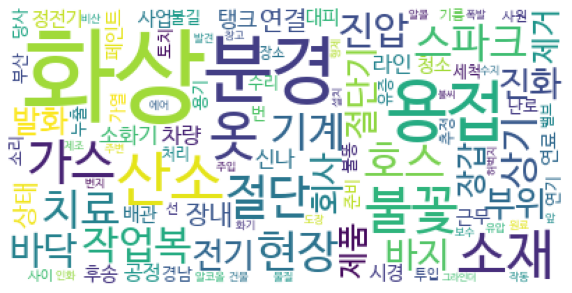

In [11]:
# wordcloud 패키지 다운로드
# !pip install wordcloud
from wordcloud import WordCloud
import matplotlib.pyplot as plt
nouns = []
for post in 화재_post['재해개요']:
    for noun in tagger.nouns(post):
        if noun not in list(df_stopwords.get("불용어")):
            nouns.append(noun)
num_top_nouns = 100
nouns_counter = Counter(nouns)
top_nouns = dict(nouns_counter.most_common(num_top_nouns)[:200])
print(top_nouns)

wc = WordCloud(background_color="white", font_path='NanumBarunGothic.ttf')
wc.generate_from_frequencies(top_nouns)
# World
# 많이 나타나는 단어일수록 크게 나타남

figure = plt.figure()
figure.set_size_inches(10, 10)
ax = figure.add_subplot(1, 1, 1)
ax.axis("off")
ax.imshow(wc)
wc.to_file(filename="화재_WC_ENTIRE.png") # to_file 함수
tagger = Mecab()

# posts

In [12]:
# 두번째 tokenizer(mecab)
def tokenizer_2(raw_texts, stop_words=list(df_stopwords.get("불용어"))):
    nouns = []
    for noun in tagger.nouns(raw_texts):
        if noun not in stop_words and len(noun)>1:
            nouns.append(noun)
    return nouns

print(화재_post['재해개요'].iloc[0])
print(tokenizer_2(화재_post['재해개요'].iloc[0]))

주조사업장내 가우징 작업장에서 롤초크 안쪽에 붙어있는 소착을 제거하기 위해서 가우징 기계를 이용하여 작업하던 중 가우징 불똥이 내경 단차부위에 두딪혀 작업자 쪽으로 뛰어 점퍼에 불이 붙었으나, 방독마스크와 용접면을 쓰고 있어서 불이 붙은 줄 모르다가 늦게 인지하여 왼쪽팔과 가슴쪽에 화염화상을 입음.
['주조사', '업장', '우징', '초크', '안쪽', '소착', '제거', '우징', '기계', '우징', '불똥', '내경', '단차', '부위', '점퍼', '방독', '마스크', '용접면', '인지', '가슴', '화상']


# TF-IDF

In [13]:
tfidfv = TfidfVectorizer(
    tokenizer = tokenizer_2, # 문장에 대한 tokenizer (위에 정의한 함수 이용)
    min_df = 10,            # 단어가 출현하는 최소 문서의 개수
    sublinear_tf = True,    # tf값에 1+log(tf)를 적용하여 tf값이 무한정 커지는 것을 막음
    stop_words = list(df_stopwords.get("불용어"))
)
X = tfidfv.fit_transform(화재_post['재해개요'])
X_df = pd.DataFrame(X.toarray(), columns = tfidfv.get_feature_names())
X_df # TF-IDF DTM

,가동,가스,가슴,가열,강서구,건물,건조,견해,결과,경기,...,호수,호스,화기,화상,확산,회사,후송,휘발유,흡입,히터
0,0.000000,0.000000,0.460715,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.000000,0.000000,0.132635,0.0,0.000000,0.0,0.0,0.0,0.0
1,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.236013,0.0,0.0,...,0.0,0.000000,0.000000,0.062808,0.0,0.162332,0.0,0.0,0.0,0.0
2,0.000000,0.267137,0.000000,0.0,0.000000,0.0,0.0,0.256902,0.0,0.0,...,0.0,0.282098,0.000000,0.068367,0.0,0.000000,0.0,0.0,0.0,0.0
3,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.223044,0.0,0.0,...,0.0,0.000000,0.000000,0.059357,0.0,0.000000,0.0,0.0,0.0,0.0
4,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.195508,0.0,0.0,...,0.0,0.000000,0.000000,0.109188,0.0,0.000000,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
935,0.235921,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.155323,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0
936,0.599738,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.000000,0.000000,0.162021,0.0,0.000000,0.0,0.0,0.0,0.0
937,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.377353,0.000000,0.154842,0.0,0.000000,0.0,0.0,0.0,0.0
938,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.000000,0.000000,0.104807,0.0,0.000000,0.0,0.0,0.0,0.0


# CountVector DTM

In [16]:
from sklearn.feature_extraction.text import CountVectorizer
countv = CountVectorizer(
                         min_df=5 # 최소 단어 등장 횟수
                        ,stop_words = list(df_stopwords.get("불용어"))
                        )
sp_mat = countv.fit_transform(sentence_list)


# 희소행렬을 np array로
count_df = pd.DataFrame(sp_mat.toarray(),columns = countv.get_feature_names())
count_df


,가공,가동,가량,가스,가스통,가슴,가열,강서구,개_,개방,...,회사,회수,회전,후송,휘발,휘발유,휴대,휴식,흡입,히터
0,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,1,0,0,0
2,0,0,0,2,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
935,1,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
936,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
937,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
938,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [17]:
# count Vector 기반 동시 단어 행렬
count_df_transpose = count_df.transpose()
count_df_transpose # 전치 행렬
count_term_document_matrix = count_df_transpose.dot(count_df) # 행렬 * 전치행렬
count_term_document_matrix # 동시 단어 행렬

,가공,가동,가량,가스,가스통,가슴,가열,강서구,개_,개방,...,회사,회수,회전,후송,휘발,휘발유,휴대,휴식,흡입,히터
가공,8,1,0,1,0,0,0,1,0,0,...,1,0,0,0,0,0,0,0,0,0
가동,1,30,4,0,0,1,0,0,0,8,...,0,1,1,0,1,0,0,0,1,0
가량,0,4,11,0,0,0,0,0,0,2,...,0,0,1,0,0,0,0,0,0,0
가스,1,0,0,204,8,1,6,2,0,15,...,11,10,0,11,2,0,7,1,7,0
가스통,0,0,0,8,7,0,0,0,0,0,...,3,0,0,2,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
휘발유,0,0,0,0,0,0,0,0,0,0,...,1,0,0,1,2,15,0,0,0,0
휴대,0,0,0,7,1,0,0,0,0,0,...,4,0,0,1,0,0,5,0,0,0
휴식,0,0,0,1,0,0,0,1,0,0,...,1,0,0,2,0,0,0,9,2,0
흡입,0,1,0,7,0,0,0,0,0,0,...,1,1,0,9,0,0,0,2,22,0


In [18]:
print(len(tfidfv.vocabulary_))

256


In [115]:
# from sklearn.metrics.pairwise import cosine_similarity
# from sklearn.metrics.pairwise import euclidean_distances

# tfidf_df = pd.DataFrame(X.toarray())
# # 2번째와 3번째 문서(유클리디안 거리 값)
# print(euclidean_distances(X[1], X[2]))#, X)
# # 2번째와 3번째 문서(코사인유사도 값)
# print(cosine_similarity(X[1], X[0]))#, X)
# # [[0.1837195]]

In [116]:
# cosine_result_df = pd.read_excel("min_df5_cos_sim.xlsx")
# cosine_result_df

In [117]:
# target = 110
# y_cosine = cosine_result_df[target - 1]
# dic ={}
# for i in range(len(y_cosine)):
#     dic[i+1] = y_cosine[i]
# #8조와 비슷한 조 찾기 위함
# # euclidean distance 를 dic에 씌워 sorting 함(1부터 10위까지)
# sorted(dic.items(), key=lambda x: x[1], reverse = True)[0:20]

In [19]:
m = TSNE(learning_rate = 50,random_state=1)
tsne_features = m.fit_transform(pd.DataFrame(X.toarray()))
tsne_features

array([[  1.8720914,  -3.9734561],
       [-31.190601 , -10.202975 ],
       [-32.06546  , -11.14045  ],
       ...,
       [ 17.242655 ,  15.158644 ],
       [  7.9056077,   6.3332176],
       [-22.93154  ,   8.86938  ]], dtype=float32)

In [20]:
df_tsne = pd.DataFrame()
df_tsne['x'] = tsne_features[:,0]
df_tsne['y'] = tsne_features[:,1]

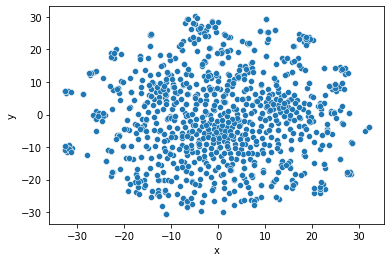

In [21]:
sns.scatterplot(x="x",y="y",data = df_tsne)
plt.show()

# Silhouette score

In [121]:
# # Silhouette score
# from sklearn.metrics import silhouette_score
# k_range=range(2,50)
# best_n=-1
# best_silhouette_score = -1
# silhouette_score_arr = []
# for k in k_range:
#     kmeans=KMeans(n_clusters=k, random_state=200)
#     kmeans.fit(X_df)
#     clusters=kmeans.predict(X_df)
#     score=silhouette_score(X_df,clusters)
#     print('k:',k,'score: ',score)
#     silhouette_score_arr.append(score)

#     if score> best_silhouette_score:
#         best_n=k
#         best_silhouette_score=score
        
# print('best_n:',best_n,'best score:',best_silhouette_score)
# silhouette_score_arr=np.array(silhouette_score_arr)





In [122]:
# print('best silhoutte_score : ',best_silhouette_score)
# plt.plot(k_range,silhouette_score_arr, 'o-')
# plt.title('silhouette_score')
# plt.xlabel('Number of clusters')
# plt.ylabel('silhouette_score')
# plt.show() # 22

In [123]:
# # import neccessaries librariesimport pandas as pd
# import numpy as np
# import matplotlib.pyplot as plt
# %matplotlib inline
# from sklearn import datasets
# from sklearn.cluster import KMeans
# from sklearn.metrics import silhouette_samples,silhouette_score

# # load into Dataframe 

# for i,k in enumerate(range(10,35)):
    
#     fig, ax = plt.subplots(1,1,figsize=(10,5))
    
#     # Run the kmeans algorithm
#     kmeans=KMeans(n_clusters=k, random_state=200)
#     kmeans.fit(X_df)
#     clusters=kmeans.predict(X_df)
#     score=silhouette_score(X_df,clusters)
#     # get silhouette
#     silhouette_vals = silhouette_samples(X_df,clusters)
#         #silhouette_vals
#     # silhouette plot
#     y_ticks = []
#     y_lower = y_upper = 0
#     for i,cluster in enumerate(np.unique(clusters)):


#         cluster_silhouette_vals = silhouette_vals[clusters ==cluster]
#         cluster_silhouette_vals.sort()
#         y_upper += len(cluster_silhouette_vals)

#         ax.barh(range(y_lower,y_upper),
#         cluster_silhouette_vals,height =1);
#         ax.text(-0.03,(y_lower+y_upper)/2,str(i+1))
#         y_lower += len(cluster_silhouette_vals)

#         # Get the average silhouette score 
#         avg_score = np.mean(silhouette_vals)
#         ax.axvline(avg_score,linestyle ='--',
#         linewidth =2,color = 'green')
#         ax.set_yticks([])
#         ax.set_xlim([-0.1, 1])
#         ax.set_xlabel('Silhouette coefficient values')
#         ax.set_ylabel('Cluster labels')
# #         ax.set_title('Silhouette plot for the various clusters');

    
#     # scatter plot of data colored with labels
    

#     plt.tight_layout()
#     plt.suptitle(f' Silhouette analysis using k = {k}',fontsize=16,fontweight = 'semibold')
# #     plt.savefig(f'Silhouette_analysis_{k}.jpg')

# Clustering

In [22]:
n_clusters = 20 ## 
kmeans = KMeans(n_clusters=n_clusters)
# kmeans = KMeans(n_clusters=4,verbose = 1)
kmeans

# 모델에 fitting 하기
# kmeans.fit(tsne_features) # 축소된놈 Fitting
kmeans.fit(X.toarray()) # 축소 안한놈 Fitting
# kmeans.fit(features_kpca)

# y_kmeans = kmeans.predict(tsne_features)
y_kmeans = kmeans.predict(X.toarray())
# y_kmeans = kmeans.predict(features_kpca)

y_kmeans[0:10] # 군집화 된 결과


array([ 4, 19, 19, 19, 19, 14, 19,  5, 14, 14], dtype=int32)

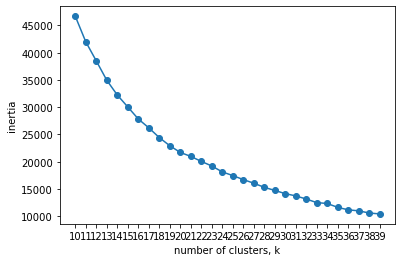

In [25]:
ks = range(10,40)

inertias = []

for k in ks:
    model = KMeans(n_clusters=k)
#     model.fit(X.toarray()) # 축소 안한 inertia
    model.fit(tsne_features) # tsne한 놈
    inertias.append(model.inertia_)
# Plot ks vs inertias
plt.plot(ks, inertias, '-o')
plt.xlabel('number of clusters, k')
plt.ylabel('inertia')
plt.xticks(ks)
plt.show()


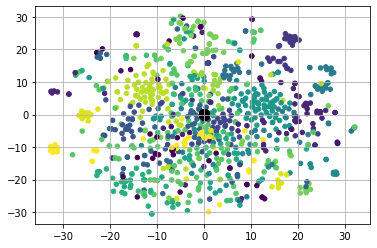

In [26]:
plt.scatter(np.array(tsne_features)[:,0], np.array(tsne_features)[:,1], c=y_kmeans, s=20, cmap='viridis')
centers = kmeans.cluster_centers_
plt.scatter(centers[:,0], centers[:,1], c='black', s=100, alpha=0.5)
plt.grid()
plt.show()

In [28]:
clustered_dic = {}
clustered_list = []
cluster_num = len(set(y_kmeans))
for idx,i in enumerate(y_kmeans):
    if i not in clustered_dic:
        clustered_dic[i] = [df_화재['연번'].iloc[idx]]
    else:
        clustered_dic[i].append(df_화재['연번'].iloc[idx])
clustered_dic
# 클러스터링이 된 패키지들
# 20개의 군집으로 생성

clustered_dic = sorted(clustered_dic.items(), key=lambda x: x[0])
df_cluster = pd.DataFrame(clustered_dic,columns=['num','clusters'])
cluster_num = [len(i) for i in df_cluster['clusters']]
df_cluster['cluster_num'] = cluster_num

df_cluster


,num,clusters,cluster_num
0,0,"[20055, 41679, 49135, 53087, 63762, 64141, 893...",33
1,1,"[9912, 59710, 59717, 59718, 59719, 59792, 7106...",20
2,2,"[25773, 27304, 29210, 42577, 46481, 48308, 498...",63
3,3,"[22843, 50334, 167870, 201490, 329762, 341653,...",32
4,4,"[43, 16156, 26226, 26271, 29488, 53781, 68810,...",40
5,5,"[3294, 9571, 36035, 50874, 57688, 59905, 62818...",31
6,6,"[10655, 19655, 40593, 40594, 49242, 49268, 565...",54
7,7,"[8391, 16036, 19923, 22194, 83719, 95266, 1014...",23
8,8,"[37541, 51838, 52881, 52978, 53774, 56188, 565...",48
9,9,"[15093, 21544, 29671, 29763, 29764, 29776, 297...",36


In [29]:
label = df_cluster.iloc[0].clusters
for key in df_cluster.iloc[0].clusters:
    print(df_화재[df_화재["연번"] == key]["재해개요"])

88    KAD 한국자동문에서 모든 자동차 정비에 자동도어 설치중에 용접 부주의로 화재가 발...
Name: 재해개요, dtype: object
189    2012년 5월 25일 18시경 성형9호기 YF D/B INR PR MLG'G라인 ...
Name: 재해개요, dtype: object
231    2012년 6월 24일 거래처인 유)디알텍 에서 옥상집진기 내에 있는 필터 교환 작...
Name: 재해개요, dtype: object
254    수원시 영통구 원천동 235번지에서 엔진오일을 교환하던 중 엔진과열된 상태에서 연료...
Name: 재해개요, dtype: object
325    08월27일 05:50경 2공장 알류미늄 재보관소에서 원인 미상의 화재가 발생해 화...
Name: 재해개요, dtype: object
328    2012년 8월 28일 대구시 달서구 월암동 소재 성진공업사 현장내에서 도장작업 중...
Name: 재해개요, dtype: object
438    2012년11월29일겨 12:00경카드기동 화재로인해 초기진압도중 화상을 입어 치료함
Name: 재해개요, dtype: object
483    업무 작업중 작업재료 가열중 가열되어 화재 발생하여 화재 진압 중 화상
Name: 재해개요, dtype: object
554    2013년 4월5일 오전 7시45분 레미콘을 상차하여(발주처:대산면사무소/현장명:연...
Name: 재해개요, dtype: object
956    2014년 6월 30일 경기도 안성시 죽산면 두현리 522-1번지 내에서 외부에 설...
Name: 재해개요, dtype: object
959    2014년 6월 30일 오후 4시 30분경 경기 안성시 죽산면 두현리 522-1번지...
Name: 재해개요, dtype: object
1008    2014년 09월 03일 수요일 오전 9시 50분경 B동 2층 원자재 창고에서 본인...
Name: 재해개요, dtype: object
1009    2014년09월

In [30]:
y_kmeans = kmeans.predict(X.toarray())
X_df['cluster'] = y_kmeans

In [31]:
total_cluster = []
total_cluster_index = []
for ci in range(0,n_clusters):
    semi_cluster= X_df[X_df['cluster']==ci]
    total_cluster_index.append(list(semi_cluster.index))
    
    cluster_sentence_list = []
    for key in semi_cluster.index:
        cluster_sentence_list.append(df_화재.iloc[key]["재해개요"])
    total_cluster.append(cluster_sentence_list)

# 동시단어행렬을 만들기 위해 cluster 별 형태로 리스트 추출

In [32]:
# 명사부분 추출
sentence_list = []
morphs_list = []
all_cluster_sentence = []
tagger = Mecab()
sentence_nouns_list = []
for clus in total_cluster:
    cluster_sentence = []
    for post in clus:
        ne = ""
        for noun in tagger.nouns(post):
            if noun not in list(df_stopwords.get("불용어")):
                if len(noun) == 1:
                        noun = noun+'_'
                        ne = ne + ' ' +noun
                else:
                    ne = ne +' '+noun
        cluster_sentence.append(ne)

    all_cluster_sentence.append(cluster_sentence) # 한 클러스터의 전체 단어 
all_cluster_sentence[0]

[' 한국 자동문 자동차 정비 자동 설치 용접 부주의 진압',
 ' 시경 형_ 호기 라인 식모 진압 안전 행동 좌측 겨드랑 부위 화상',
 ' 거래처 디_ 알텍 옥상 집진기 필터 교환 화상',
 ' 수원시 영통구 원천동 번지 엔진 오일 교환 엔진 과열 상태 연료 호스 차량 앞면 화상 차량 진압 배선 상태 차량 손실',
 ' 알류 늄_ 보관소 미상 진압 진압 불꽃 지게차 확산 진압 엉덩이 옆구리 팔꿈치 화상',
 ' 대구시 달서구 월암동 소재 성진 공업 현장 도장 전선 스파크 쇼트 초기 진압 사고자 옷_ 화상',
 ' 겨_ 카드 기동 초기 진압 화상 치료',
 ' 재료 열중 가열 진압 화상',
 ' 레미콘 상차 발주 대산 면사무소 장명 연산 농_ 포장 현장 도착 정도 대기 렉스 드럼 회전 변환 분경 차량 설치 변환 장치 운전석 문_ 상태 장갑 진압 양손 가량 화상 피해 상황',
 ' 경기도 안성시 죽산면 두현리 번지 설치 집진기 진압 집진기 문_ 폭발 화상',
 ' 분경 경기 안성시 죽산면 두현리 번지 설치 집진기 진압 집진기 문_ 화상',
 ' 수요일 분경 원자재 창고 승현 조장 외_ 전날 화요일 저녁 출고 수출 본드 옥외 장소 창고 보관 공간 부족 원자재 창고 적재 파렛 바닥 본드 바닥 본드 냄새 대형 선풍기 원자재 창고 가동 본드 청소 청소 도구 신나 원자재 창고 해라 바닥 청소 와중 바닥 순식간 연기 앞_ 원자재 창고 창문 창문 배관',
 ' 수요일 분경 원자재 창고 성일 대리 외_ 전날 화요일 저녁 출고 수출 본드 옥외 장소 창고 보관 공간 부족 원자재 창고 적재 파렛 바닥 본드 바닥 본드 냄새 대형 선풍기 원자재 창고 가동 본드 청소 청소 도구 신나 원자재 창고 해라 바닥 청소 성일 쓰레기통 와중 연기 인지 바닥 순식간 소화기 연기 창고 앞_ 지경 바닥 창문 창문 배관',
 ' 내외 주변 청소 쓰레기 서준범 구릉 사원 마당 깡통 창고 사무실 쓰레기 수거 소각 종이 경유 옷_ 화상',
 ' 분경 거울 글씨 입구 연기 유리 간지 적재 순식간 불길 당황 맨

## 문서 유사도에 따른 중복 값 삭제

In [34]:
def drop_diplicate(semi_cluster):
    clean_cluster = [] 
    while semi_cluster:
        flag1 = True
        flag2 = True
        document = semi_cluster.pop(0)

        for sc in semi_cluster:

            score= fuzz.token_set_ratio(sc,document)

            if score >= 90:

                flag1 = False
                break

        for sc in clean_cluster:
            score= fuzz.token_set_ratio(document,sc)
            if score>=90:

                flag2 = False
                break

        if flag1==False or flag2==False:
            continue

        clean_cluster.append(document)
    return clean_cluster

# Network 시각화

In [50]:
import os
dir_name ="화재_cluster" 
try:
    os.mkdir(dir_name)
except:
    pass

In [51]:
from collections import defaultdict
from networkx.algorithms.community import girvan_newman
from sklearn.feature_extraction.text import CountVectorizer

all_daf = []
min_df = 3
countv = CountVectorizer(
                         min_df=min_df # 최소 단어 등장 횟수
                        ,stop_words = list(df_stopwords.get("불용어"))
                        )
                             
for ci in range(n_clusters): # ci : cluster_index
    
    semi_cluster= all_cluster_sentence[ci] #cluster 별로 워드 임베딩 결과 필터링
    clean_cluster = drop_diplicate(semi_cluster)
    if len(clean_cluster)<=min_df:
        continue
#     semi_cluster.to_csv(sort_name+'_re_cluster'+str(ci)+'_re_DTM.csv',encoding='utf-8-sig') 
                                       
    sp_mat = countv.fit_transform(clean_cluster)


    # 희소행렬을 np array로
    count_df = pd.DataFrame(sp_mat.toarray(),columns = countv.get_feature_names())
    count_df.to_csv('./'+dir_name+'/화재_DTM_cluster'+str(ci)+'.csv',encoding = 'utf-8-sig')

    # count Vector 기반 동시 단어 행렬
    count_df_transpose = count_df.transpose()
    count_df_transpose # 전치 행렬
    count_term_document_matrix = count_df_transpose.dot(count_df)  
                                       
    count_term_document_matrix.to_csv('./'+dir_name+'/화재_동시단어출현_cluster'+str(ci)+'.csv',encoding='utf-8-sig') 

    
    #네트워크 시각화를 위한 input 데이터를 만드는과정 
    dic = {}
    dic['word'] = []
    dic['toword'] = []
    dic['count'] = [] 

    count = defaultdict(int)

    idx = 1
    for col in count_term_document_matrix.columns:
        for col2 in count_term_document_matrix.columns[idx:]:
            score=count_term_document_matrix.loc[col,col2]
            if score == 0 :
                continue
#             if score<=0.80:
#                 continue
            dic['count'].append(score)

            dic['word'].append(col)
            dic['toword'].append(col2)

            count[col]+=1
            count[col2]+=1
        idx+=1
    
    all_daf.append(dic)

    daf = pd.DataFrame(dic) # dic to dataframe
    
    g = nx.from_pandas_edgelist(daf,'word','toword',)
    
    plt.figure(figsize=(15, 15))
    pos = nx.spring_layout(g,weight='count',k=1*1/np.sqrt(len(g.nodes())), iterations=50)

    pos=nx.kamada_kawai_layout(g,
    #                            dist=(2,3),
                               weight='count',
                               scale=10,
                               center=(0,5),
                               dim=2,)
    
    import matplotlib.font_manager as fm
    font_name = fm.FontProperties(fname = "NanumGothicCoding-Bold.ttf").get_name()
    
    nx.draw_networkx(g, with_labels = True,
                     pos = pos,
                     node_color= '#18A8F1',
                     node_size = 900,
                     font_color ='black',
                     font_weight ='bold',
                     font_size =10,
                     font_family = font_name)
    # (g,pos,node_size=[800], node_color='pink', font_size=12,font_family='AppleGothic',)

    plt.savefig('./'+dir_name+'/화재_cluster'+str(ci)+'.png')

# plt.show()



In [52]:
daf

,word,toword,count
0,가스,견해,2
1,가스,경고,2
2,가스,경북,1
3,가스,고의,2
4,가스,김천,2
...,...,...,...
1770,호스,후송,1
1771,호흡,회사,1
1772,화상,회사,12
1773,화상,후송,8


In [53]:
len(all_daf)

0

In [54]:
# -*- encoding: utf-8 -*-
import pandas as pd
import networkx as nx
import operator
import numpy as np

for ci in range(len(all_daf)):
    

    daf = pd.DataFrame(all_daf[ci]) # dic to dataframe
    
    # 단어쌍 동시출현 빈도수를 담았던 networkx.csv파일을 불러온다.

    # 중심성 척도 계산을 위한 Graph를 만든다
    G_centrality = nx.Graph()
    
#     g = nx.from_pandas_edgelist(daf,'word','toword',)

    # 빈도수가 1 이상인 단어쌍에 대해서만 edge(간선)을 표현한다.
    for ind in range((len(np.where(daf['count'] >= 1)[0]))):
        G_centrality.add_edge(daf['word'][ind], daf['toword'][ind], weight=int(daf['count'][ind]))

    dgr = nx.degree_centrality(G_centrality)        # 연결 중심성
    btw = nx.betweenness_centrality(G_centrality)   # 매개 중심성
    cls = nx.closeness_centrality(G_centrality)     # 근접 중심성
    egv = nx.eigenvector_centrality(G_centrality)   # 고유벡터 중심성
    pgr = nx.pagerank(G_centrality)                 # 페이지 랭크

    # 중심성이 큰 순서대로 정렬한다.
    sorted_dgr = sorted(dgr.items(), key=operator.itemgetter(1), reverse=True)
    sorted_btw = sorted(btw.items(), key=operator.itemgetter(1), reverse=True)
    sorted_cls = sorted(cls.items(), key=operator.itemgetter(1), reverse=True)
    sorted_egv = sorted(egv.items(), key=operator.itemgetter(1), reverse=True)
    sorted_pgr = sorted(pgr.items(), key=operator.itemgetter(1), reverse=True)

    # 단어 네트워크를 그려줄 Graph 선언
    G = nx.Graph()

    # 페이지 랭크에 따라 두 노드 사이의 연관성을 결정한다. (단어쌍의 연관성)
    # 연결 중심성으로 계산한 척도에 따라 노드의 크기가 결정된다. (단어의 등장 빈도수)
    for i in range(len(sorted_pgr)):
        G.add_node(sorted_pgr[i][0], nodesize=sorted_dgr[i][1])

    for ind in range((len(np.where(daf['count'] > 1)[0]))):
        G.add_weighted_edges_from([(daf['word'][ind], daf['toword'][ind], int(daf['count'][ind]))])
        
    plt.figure(figsize=(10, 10))

    # 노드 크기 조정
    sizes = [G.nodes[node]['nodesize'] * 2000 for node in G]

    options = {
        'edge_color': '#000000',
        'width': 1,
        'with_labels': True,
        'font_weight': 'regular',
    }

    # 폰트 설정을 위한 font_manager import
    import matplotlib.font_manager as fm
    import matplotlib.pyplot as plt

    # 폰트 설정
    fm._rebuild()		# 1회에 한해 실행해준다. (폰트 새로고침, 여러번 해줘도 관계는 없다.)
    font_fname = "NanumGothicCoding-Bold.ttf"     # 여기서 폰트는 C:/Windows/Fonts를 참고해도 좋다.
    fontprop = fm.FontProperties(fname=font_fname, size=30).get_name()

    nx.draw(G, node_color = "#18A8F1", node_size=sizes, pos=nx.spring_layout(G, k=3.5, iterations=100), **options, font_size =12, font_family=fontprop)  # font_family로 폰트 등록
    ax = plt.gca()
    ax.collections[0].set_edgecolor("#18A8F1")
    
    plt.savefig('./'+dir_name+'/화재_중심성분석_cluster'+str(ci)+'.png')
    plt.show()

# 폭발 파열에 대한 네트워크 시각화

In [55]:
# 명사부분 추출
sentence_list = []
morphs_list = []

tagger = Mecab()
sentence_nouns_list = []
for post in 폭파_post['재해개요']:
    morphs_value = []
    for noun in tagger.nouns(post):
        if noun not in list(df_stopwords.get("불용어")):
            if len(noun) == 1:
                    noun = noun+'_'
            morphs_list.append(noun)

            morphs_value.append(noun)
    sentence_nouns_list.append(morphs_value)
sentence_nouns_list[0:10]

[['보고',
  '사유',
  '스주',
  '입실',
  '대기',
  '질소',
  '가스통',
  '체결',
  '부위',
  '불량',
  '폭발',
  '파편',
  '복부',
  '강타',
  '부상',
  '치료',
  '국민',
  '건강',
  '보험',
  '공단',
  '부당',
  '이득',
  '환수',
  '조치',
  '조사',
  '견해',
  '법_',
  '규정',
  '산업재',
  '조사표',
  '제출',
  '최근',
  '산재',
  '보고',
  '처분',
  '사실',
  '경고',
  '조치',
  '종결',
  '붙임',
  '산재',
  '경위서',
  '산업재',
  '조사표',
  '장소',
  '수주',
  '입실',
  '목적',
  '가스',
  '주입',
  '대기',
  '도구',
  '가스',
  '주입기',
  '내용',
  '송_',
  '대기',
  '재중',
  '사유',
  '체결',
  '부위',
  '미세',
  '불량',
  '체결',
  '분리',
  '파편',
  '복부',
  '강타'],
 ['보고',
  '사유',
  '산업재',
  '보고',
  '사실',
  '조사',
  '견해',
  '경고',
  '조치',
  '장소',
  '상기',
  '목적',
  '도구',
  '카통',
  '내용',
  '주의',
  '사유',
  '카통',
  '폭발',
  '화상'],
 ['보고',
  '사유',
  '실수',
  '방치',
  '담당자',
  '산재',
  '처리',
  '절차',
  '건강보험공단',
  '환수',
  '처리',
  '마무리',
  '오인',
  '조사',
  '견해',
  '정도',
  '고의',
  '판단',
  '경고',
  '조치',
  '종결',
  '장소',
  '장내',
  '목적',
  '휴식',
  '추위',
  '도구',
  '내용',
  '사유',
  '더미',
  '락_',
  '카_',
  '폭발',
  '화상'],
 ['보고',

In [139]:
# 가장많이 나오는 명사 상위 20개
from collections import Counter
num_top_nouns = 200
nouns_counter = Counter(morphs_list)
top_nouns = dict(nouns_counter.most_common(num_top_nouns)[:200])
top_nouns
# print(len(counted_nouns))

{'폭발': 645,
 '가스': 217,
 '드럼통': 198,
 '산소': 133,
 '절단': 114,
 '소재': 106,
 '탱크': 102,
 '현장': 101,
 '용접': 84,
 '부위': 73,
 '용기': 73,
 '치료': 71,
 '스프레이': 66,
 '제거': 66,
 '절단기': 65,
 '기계': 65,
 '압력': 58,
 '타이어': 55,
 '소리': 53,
 '상기': 52,
 '회사': 52,
 '점검': 52,
 '파편': 51,
 '뚜껑': 51,
 '투입': 50,
 '제품': 50,
 '상태': 50,
 '호스': 48,
 '부상': 47,
 '드럼': 47,
 '차량': 45,
 '유증': 43,
 '장소': 41,
 '전기': 41,
 '준비': 41,
 '교체': 41,
 '원료': 40,
 '수리': 40,
 '추정': 40,
 '진행': 38,
 '용해': 38,
 '건조': 36,
 '후송': 36,
 '제조': 36,
 '해임': 35,
 '폭_': 35,
 '불꽃': 35,
 '충격': 34,
 '누출': 33,
 '열_': 33,
 '용탕': 33,
 '밸브': 33,
 '처리': 32,
 '연결': 32,
 '카_': 31,
 '버너': 31,
 '주입': 30,
 '락_': 30,
 '파이프': 30,
 '당사': 30,
 '위치': 30,
 '바닥': 29,
 '골절': 29,
 '토치': 29,
 '스파크': 29,
 '반응': 29,
 '청소': 29,
 '상부': 29,
 '사유': 28,
 '가열': 28,
 '당시': 28,
 '알루미늄': 28,
 '용접기': 27,
 '번_': 27,
 '근무': 27,
 '수지': 26,
 '앞_': 26,
 '설비': 26,
 '공기': 26,
 '배터리': 25,
 '상황': 25,
 '물질': 25,
 '보일러': 25,
 '업체': 25,
 '조치': 24,
 '조사': 24,
 '내용': 24,
 '공정': 24,
 '분진': 24,
 

In [140]:
sentence_list = []
for sentence in sentence_nouns_list:
    sentence_list.append(' '.join(sentence))


{'폭발': 645, '가스': 217, '드럼통': 198, '산소': 133, '절단': 114, '소재': 106, '탱크': 102, '현장': 101, '용접': 84, '부위': 73, '용기': 73, '치료': 71, '스프레이': 66, '제거': 66, '절단기': 65, '기계': 65, '압력': 58, '타이어': 55, '소리': 53, '상기': 52, '회사': 52, '점검': 52, '파편': 51, '뚜껑': 51, '투입': 50, '제품': 50, '상태': 50, '호스': 48, '부상': 47, '드럼': 47, '차량': 45, '유증': 43, '장소': 41, '전기': 41, '준비': 41, '교체': 41, '원료': 40, '수리': 40, '추정': 40, '진행': 38, '용해': 38, '건조': 36, '후송': 36, '제조': 36, '해임': 35, '폭': 35, '불꽃': 35, '충격': 34, '누출': 33, '열': 33, '용탕': 33, '밸브': 33, '처리': 32, '연결': 32, '카': 31, '버너': 31, '주입': 30, '락': 30, '파이프': 30, '당사': 30, '위치': 30, '바닥': 29, '골절': 29, '토치': 29, '스파크': 29, '반응': 29, '청소': 29, '상부': 29, '사유': 28, '가열': 28, '당시': 28, '알루미늄': 28, '용접기': 27, '번': 27, '근무': 27, '수지': 26, '앞': 26, '설비': 26, '공기': 26, '배터리': 25, '상황': 25, '물질': 25, '보일러': 25, '업체': 25, '조치': 24, '조사': 24, '내용': 24, '공정': 24, '분진': 24, '라인': 24, '파열': 24, '해체': 24, '머리': 24, '분리': 23, '주변': 23, '호기': 23, '가스통': 22, '조립': 22, '우측'

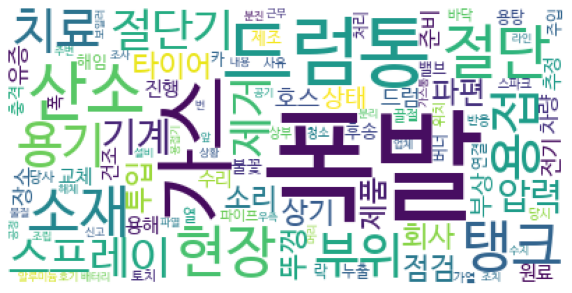

In [141]:
# wordcloud 패키지 다운로드
# !pip install wordcloud
from wordcloud import WordCloud
import matplotlib.pyplot as plt
nouns = []
for post in 폭파_post['재해개요']:
    for noun in tagger.nouns(post):
        if noun not in list(df_stopwords.get("불용어")):
            nouns.append(noun)
num_top_nouns = 100
nouns_counter = Counter(nouns)
top_nouns = dict(nouns_counter.most_common(num_top_nouns)[:200])
print(top_nouns)

wc = WordCloud(background_color="white", font_path='NanumBarunGothic.ttf')
wc.generate_from_frequencies(top_nouns)
# World
# 많이 나타나는 단어일수록 크게 나타남

figure = plt.figure()
figure.set_size_inches(10, 10)
ax = figure.add_subplot(1, 1, 1)
ax.axis("off")
ax.imshow(wc)
wc.to_file(filename="폭파_WC_ENTIRE.png") # to_file 함수
tagger = Mecab()

# posts

In [142]:
# 두번째 tokenizer(mecab)
def tokenizer_2(raw_texts, stop_words=list(df_stopwords.get("불용어"))):
    nouns = []
    for noun in tagger.nouns(raw_texts):
        if noun not in stop_words and len(noun)>1:
            nouns.append(noun)
    return nouns

print(폭파_post['재해개요'].iloc[0])
print(tokenizer_2(폭파_post['재해개요'].iloc[0]))

[비보고 사유] 가스주입실에서 이송대기중 질소가스통 체결부위 불량으로 폭발되면서 파편에 복부를 강타하여 부상을 입고 병원 치료를 하여 국민건강보험공단으로부터 부당이득금 환수조치된 건임 [조사자 견해] 법규정을 몰랐고 사고가 경미하여 산업재해조사표를 제출하지 않은 건으로 최근 3년이내 산재발생미보고로 처분 받은 사실이 없으므로 경고조치 후 종결코자 합니다. ※ 붙임: 산재발생미보고 경위서 및 산업재해조사표 [작업장소] 사업장 내 가수주입실 [작업목적] 가스주입 후 이동대기 중 [작업도구] 가스주입기 [작업내용] 이송대기 적재중에 [재해사유] 체결부위 미세불량으로 [재해발생] 체결이 분리되면서 파편이 복부강타
['보고', '사유', '스주', '입실', '대기', '질소', '가스통', '체결', '부위', '불량', '폭발', '파편', '복부', '강타', '부상', '치료', '국민', '건강', '보험', '공단', '부당', '이득', '환수', '조치', '조사', '견해', '규정', '산업재', '조사표', '제출', '최근', '산재', '보고', '처분', '사실', '경고', '조치', '종결', '붙임', '산재', '경위서', '산업재', '조사표', '장소', '수주', '입실', '목적', '가스', '주입', '대기', '도구', '가스', '주입기', '내용', '대기', '재중', '사유', '체결', '부위', '미세', '불량', '체결', '분리', '파편', '복부', '강타']


In [143]:
tfidfv = TfidfVectorizer(
    tokenizer = tokenizer_2, # 문장에 대한 tokenizer (위에 정의한 함수 이용)
    min_df = 10,            # 단어가 출현하는 최소 문서의 개수
    sublinear_tf = True,    # tf값에 1+log(tf)를 적용하여 tf값이 무한정 커지는 것을 막음
    stop_words = list(df_stopwords.get("불용어"))
)
X = tfidfv.fit_transform(폭파_post['재해개요'])
X_df = pd.DataFrame(X.toarray(), columns = tfidfv.get_feature_names())
X_df # TF-IDF DTM

,가동,가스,가스통,가슴,가열,강타,건물,건조,검사,견해,...,현장,호기,호스,혼합,화성시,화학,환경,환자,회사,후송
0,0.0,0.157109,0.170578,0.0,0.000000,0.285427,0.0,0.0,0.0,0.179964,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
1,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.0,0.0,0.261653,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
2,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.0,0.0,0.273660,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
3,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.0,0.0,0.226144,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
4,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.0,0.0,0.256821,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
813,0.0,0.000000,0.000000,0.0,0.731061,0.000000,0.0,0.0,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
814,0.0,0.322547,0.000000,0.0,0.000000,0.000000,0.0,0.0,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
815,0.0,0.322547,0.000000,0.0,0.000000,0.000000,0.0,0.0,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
816,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.0,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0


In [144]:
from sklearn.feature_extraction.text import CountVectorizer
countv = CountVectorizer(
                         min_df=5 # 최소 단어 등장 횟수
                        ,stop_words = list(df_stopwords.get("불용어"))
                        )
sp_mat = countv.fit_transform(sentence_list)


# 희소행렬을 np array로
count_df = pd.DataFrame(sp_mat.toarray(),columns = countv.get_feature_names())
count_df

# count Vector 기반 동시 단어 행렬
count_df_transpose = count_df.transpose()
count_df_transpose # 전치 행렬
count_term_document_matrix = count_df_transpose.dot(count_df) # 행렬 * 전치행렬
count_term_document_matrix # 동시 단어 행렬

,가격,가공,가동,가량,가루,가마,가스,가스통,가슴,가열,...,화기,화성,화성시,화원,화학,환경,환자,회사,회수,후송
가격,7,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
가공,0,6,0,0,0,1,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
가동,0,0,19,0,0,0,8,0,0,1,...,0,0,0,0,0,0,3,1,0,0
가량,0,0,0,5,0,0,2,0,0,0,...,0,1,0,0,0,0,0,2,0,1
가루,0,0,0,0,19,0,6,0,0,0,...,0,0,0,0,0,0,0,1,0,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
환경,0,0,0,0,0,0,4,0,0,0,...,0,0,0,0,3,10,0,0,0,0
환자,0,0,3,0,0,0,3,0,0,1,...,0,0,0,0,0,0,10,1,0,2
회사,0,0,1,2,1,0,13,0,5,0,...,0,0,0,0,1,0,1,60,0,13
회수,0,0,0,0,0,0,16,0,0,0,...,0,0,0,0,0,0,0,0,23,0


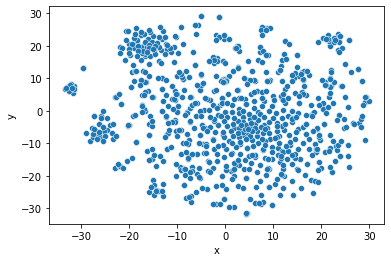

In [145]:
m = TSNE(learning_rate = 50,random_state=1)
tsne_features = m.fit_transform(pd.DataFrame(X.toarray()))
df_tsne = pd.DataFrame()
df_tsne['x'] = tsne_features[:,0]
df_tsne['y'] = tsne_features[:,1]
sns.scatterplot(x="x",y="y",data = df_tsne)
plt.show()

In [146]:
# # Silhouette score
# from sklearn.metrics import silhouette_score
# k_range=range(2,30)
# best_n=-1
# best_silhouette_score = -1
# silhouette_score_arr = []
# for k in k_range:
#     kmeans=KMeans(n_clusters=k, random_state=200)
#     kmeans.fit(X_df)
#     clusters=kmeans.predict(X_df)
#     score=silhouette_score(X_df,clusters)
#     print('k:',k,'score: ',score)
#     silhouette_score_arr.append(score)

#     if score> best_silhouette_score:
#         best_n=k
#         best_silhouette_score=score
        
# print('best_n:',best_n,'best score:',best_silhouette_score)
# silhouette_score_arr=np.array(silhouette_score_arr)



# print('best silhoutte_score : ',best_silhouette_score)
# plt.plot(k_range,silhouette_score_arr, 'o-')
# plt.title('silhouette_score')
# plt.xlabel('Number of clusters')
# plt.ylabel('silhouette_score')
# plt.show() # 22

In [147]:
n_clusters = 20
kmeans = KMeans(n_clusters=n_clusters)
# kmeans = KMeans(n_clusters=4,verbose = 1)
kmeans

# 모델에 fitting 하기
# kmeans.fit(tsne_features) # 축소된놈 Fitting
kmeans.fit(X.toarray()) # 축소 안한놈 Fitting
# kmeans.fit(features_kpca)

# y_kmeans = kmeans.predict(tsne_features)
y_kmeans = kmeans.predict(X.toarray())



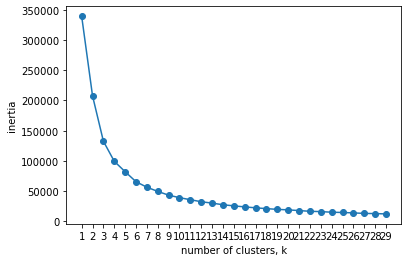

In [148]:
ks = range(1,30)

inertias = []

for k in ks:
    model = KMeans(n_clusters=k)
#     model.fit(X.toarray()) # 축소 안한 inertia
    model.fit(tsne_features) # tsne한 놈
    inertias.append(model.inertia_)
# Plot ks vs inertias
plt.plot(ks, inertias, '-o')
plt.xlabel('number of clusters, k')
plt.ylabel('inertia')
plt.xticks(ks)
plt.show()


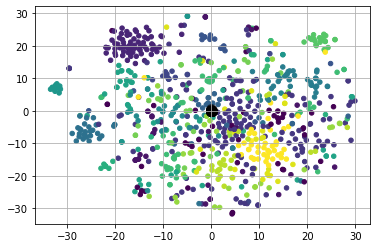

In [149]:
plt.scatter(np.array(tsne_features)[:,0], np.array(tsne_features)[:,1], c=y_kmeans, s=20, cmap='viridis')
centers = kmeans.cluster_centers_
plt.scatter(centers[:,0], centers[:,1], c='black', s=100, alpha=0.5)
plt.grid()
plt.show()

In [150]:
clustered_dic = {}
clustered_list = []
cluster_num = len(set(y_kmeans))
for idx,i in enumerate(y_kmeans):
    if i not in clustered_dic:
        clustered_dic[i] = [df_폭파['연번'].iloc[idx]]
    else:
        clustered_dic[i].append(df_폭파['연번'].iloc[idx])
clustered_dic
# 클러스터링이 된 패키지들
# 20개의 군집으로 생성

clustered_dic = sorted(clustered_dic.items(), key=lambda x: x[0])
df_cluster = pd.DataFrame(clustered_dic,columns=['num','clusters'])
cluster_num = [len(i) for i in df_cluster['clusters']]
df_cluster['cluster_num'] = cluster_num

df_cluster


,num,clusters,cluster_num
0,0,"[5922, 31727, 32502, 38856, 47530, 55607, 5566...",47
1,1,"[23387, 24220, 25440, 32088, 44303, 62843, 628...",32
2,2,"[7306, 7499, 8230, 19941, 21729, 24649, 27178,...",72
3,3,"[3420, 6352, 6916, 7407, 7826, 10323, 10807, 1...",160
4,4,"[41352, 142865, 142879, 161311, 196643, 201898...",15
5,5,"[8806, 17502, 31390, 54841, 83954, 95255, 1273...",17
6,6,"[11147, 44306, 53945, 79731, 109022, 118148, 1...",22
7,7,"[4892, 13336, 15004, 21991, 29074, 34549, 7895...",33
8,8,"[8273, 16705, 17104, 19275, 19947, 33354, 8065...",42
9,9,"[2545, 9595, 26906, 27331, 32318, 33536, 43028...",36


In [151]:
label = df_cluster.iloc[0].clusters
for key in df_cluster.iloc[0].clusters:
    print(df_폭파[df_폭파["연번"] == key]["재해개요"])

19    상기환자 반사로 앞에서 원료를 투입하던중 폭발과 함께 수상당하심
Name: 재해개요, dtype: object
141    2012년 4월 14일 10시경 부산 강서구 녹산 산업중로(송정동) 소재 태광쇼트산...
Name: 재해개요, dtype: object
148    공장내에 안전보호대 용접 중 유증기에 의해 폭발사고 발생
Name: 재해개요, dtype: object
178    2012년 5월 14일(월) 10:00시경 경기도 부천시 오정구 삼정동 18-14 ...
Name: 재해개요, dtype: object
218    우진공장내 용접 작업도중 옆 공장인 아미코트에서 폭발로 인해 구급차를 타고 화성중앙...
Name: 재해개요, dtype: object
274    블록 작업중 용접 스레그 제거제에 불이 튀겨 스레거 제거가 터지는 바람에 손가락을 ...
Name: 재해개요, dtype: object
275    진해 가주동 소재 성일 NK(주) 내 영ENG 작업장에서 검사용 MT액을 다 사용한...
Name: 재해개요, dtype: object
340    (주)한솔케미칼 전주공장내 하수경쟁력강화 TF 실험실에서 초자류를 이용한 프로필렌 ...
Name: 재해개요, dtype: object
382    바지선 맨홀 안쪽 미흡한 부분을 알려주고 내려와 장비 착용 하고 용접하러 올라가다가...
Name: 재해개요, dtype: object
384    원단중공업 내의 작업장에서 바지선 맨홀 안에 용접부위 미흡한 부분을 용접하기 위해 ...
Name: 재해개요, dtype: object
387    원당중공업내 작업장에서 바지선 맨홀 안쪽을 용접하기 위해 장비를 착용하는 과정에서 ...
Name: 재해개요, dtype: object
417    용접 작업 중 옆에 있던 신너통에 불꽃이 튀어 폭발로 인해 몸에 불이 옮겨져서 사고...
Name: 재해개요, dtype: object
432    2012. 10. 31. 08:10경 전남 영암군 삼호

In [152]:
y_kmeans = kmeans.predict(X.toarray())
X_df['cluster'] = y_kmeans

In [153]:
total_cluster = []
total_cluster_index = []
for ci in range(0,n_clusters):
    semi_cluster= X_df[X_df['cluster']==ci]
    total_cluster_index.append(list(semi_cluster.index))

    cluster_sentence_list = []
    for key in semi_cluster.index:
        cluster_sentence_list.append(df_폭파.iloc[key]["재해개요"])
    total_cluster.append(cluster_sentence_list)

In [157]:
# 명사부분 추출
sentence_list = []
morphs_list = []
all_cluster_sentence = []
tagger = Mecab()
sentence_nouns_list = []
for clus in total_cluster:
    cluster_sentence = []
    for post in clus:
        ne = ""
        for noun in tagger.nouns(post):
            if noun not in list(df_stopwords.get("불용어")):
                if len(noun) == 1:
                        noun = noun+'_'
                        ne = ne + ' ' +noun
                else:
                    ne = ne +' '+noun
        cluster_sentence.append(ne)

    all_cluster_sentence.append(cluster_sentence) # 한 클러스터의 전체 단어 


In [42]:
import os
dir_name ="폭발파열_cluster" 
try:
    os.mkdir(dir_name)
except:
    pass

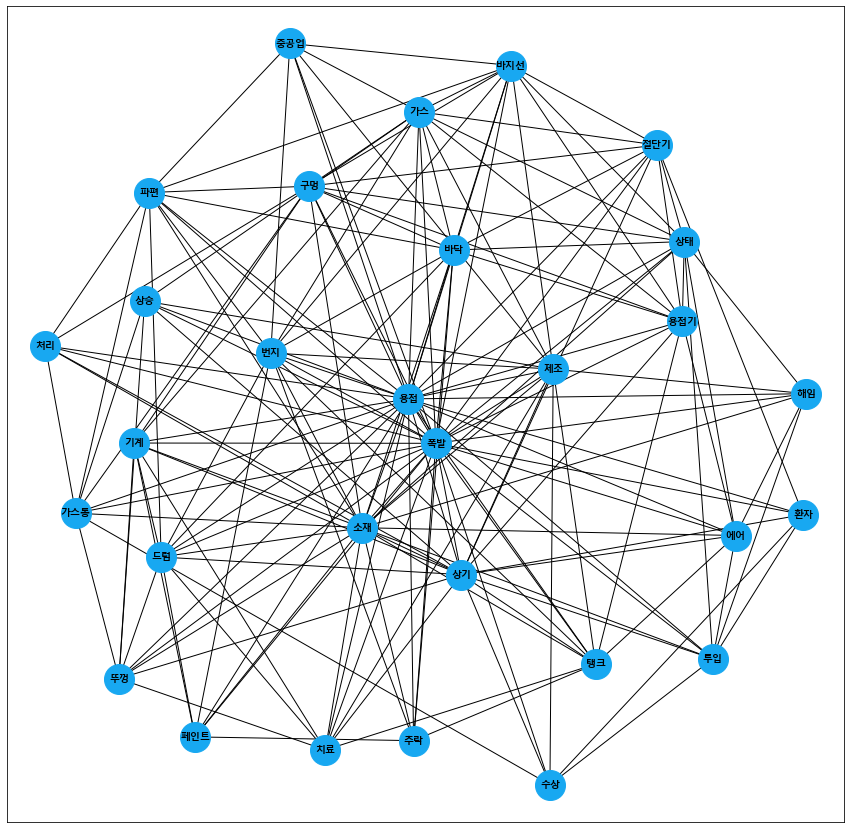

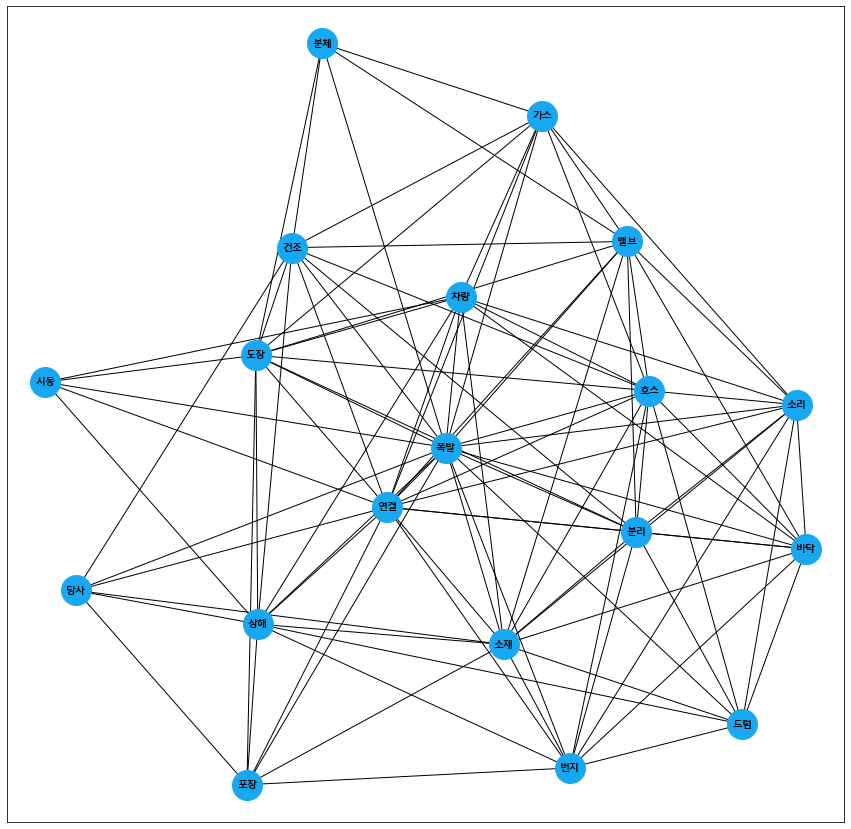

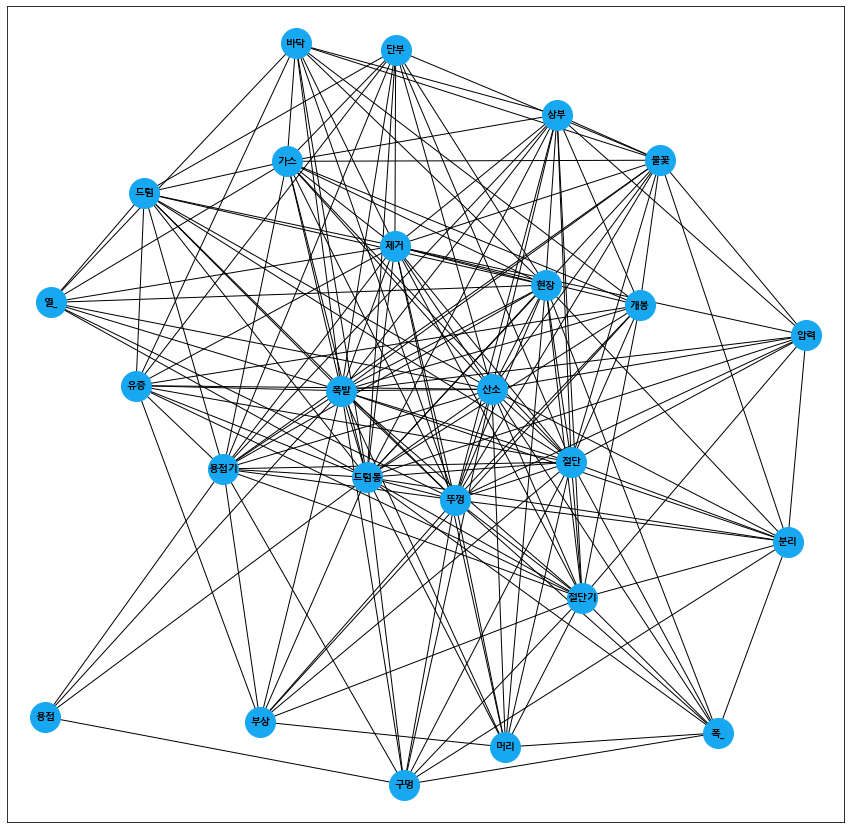

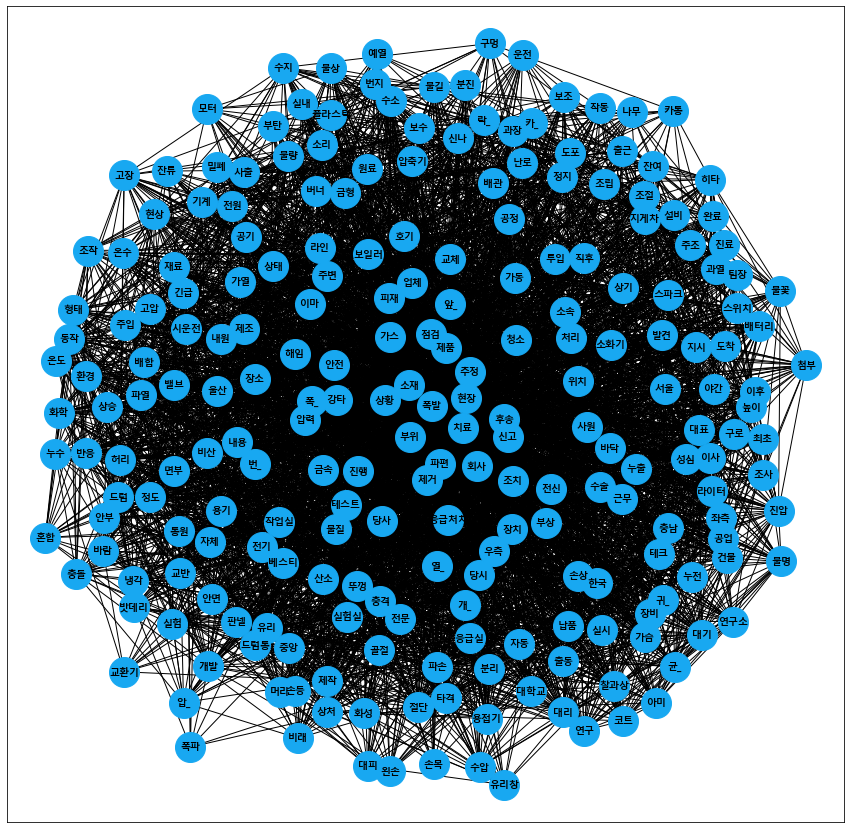

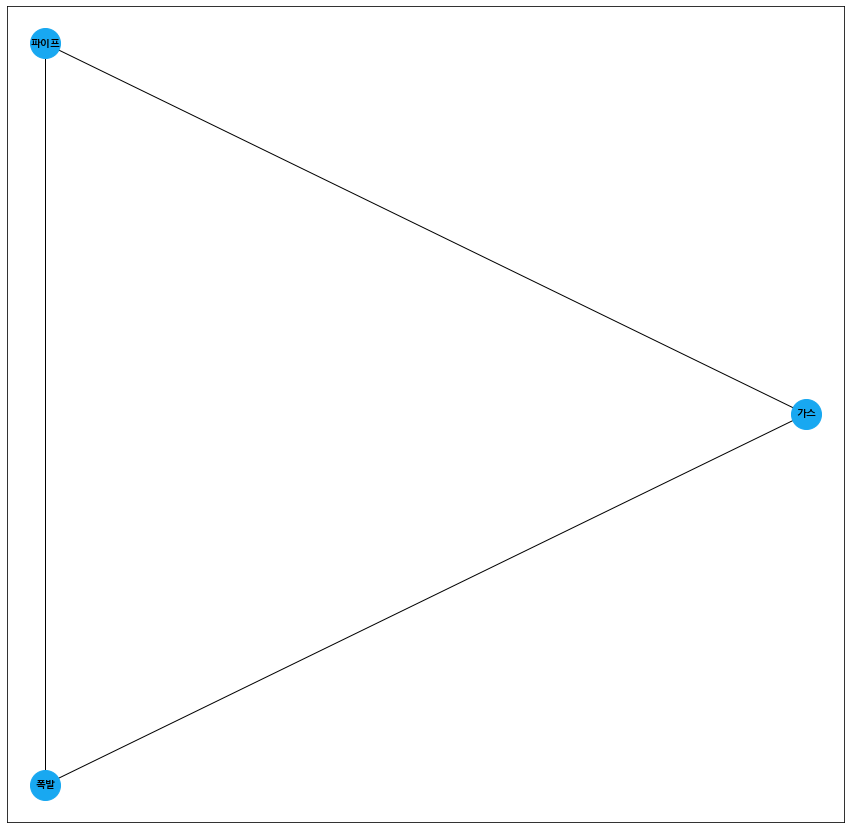

...

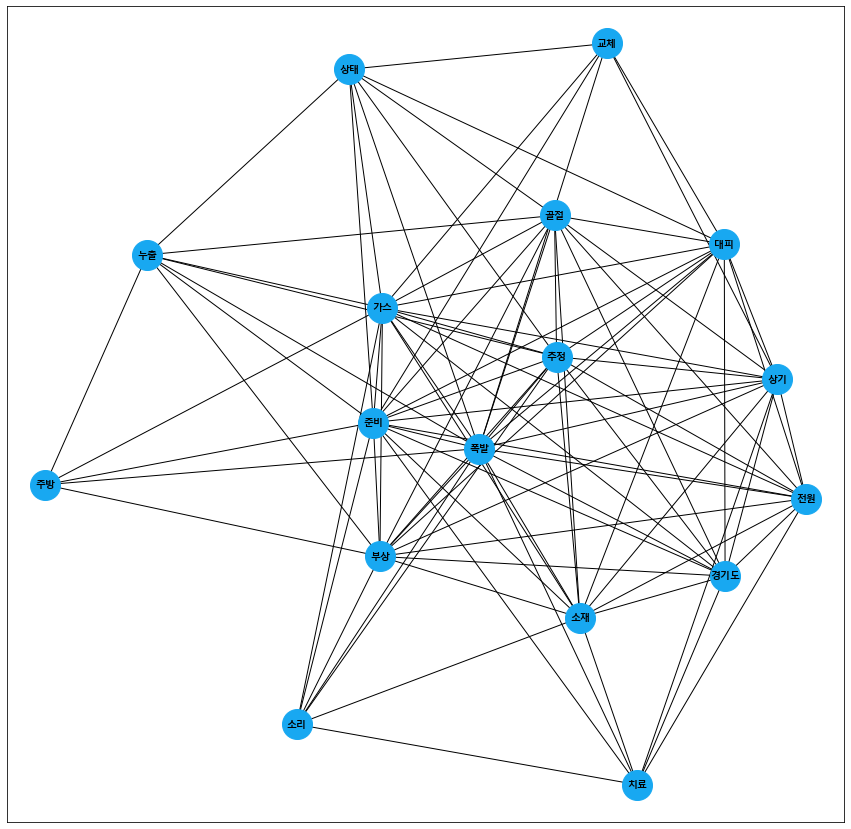

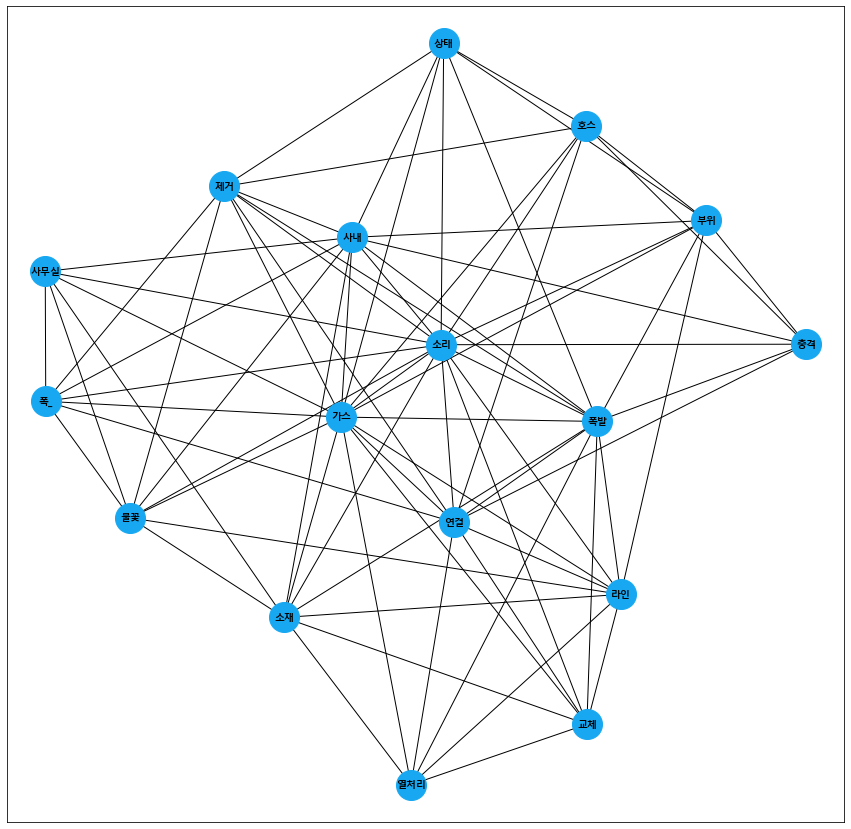

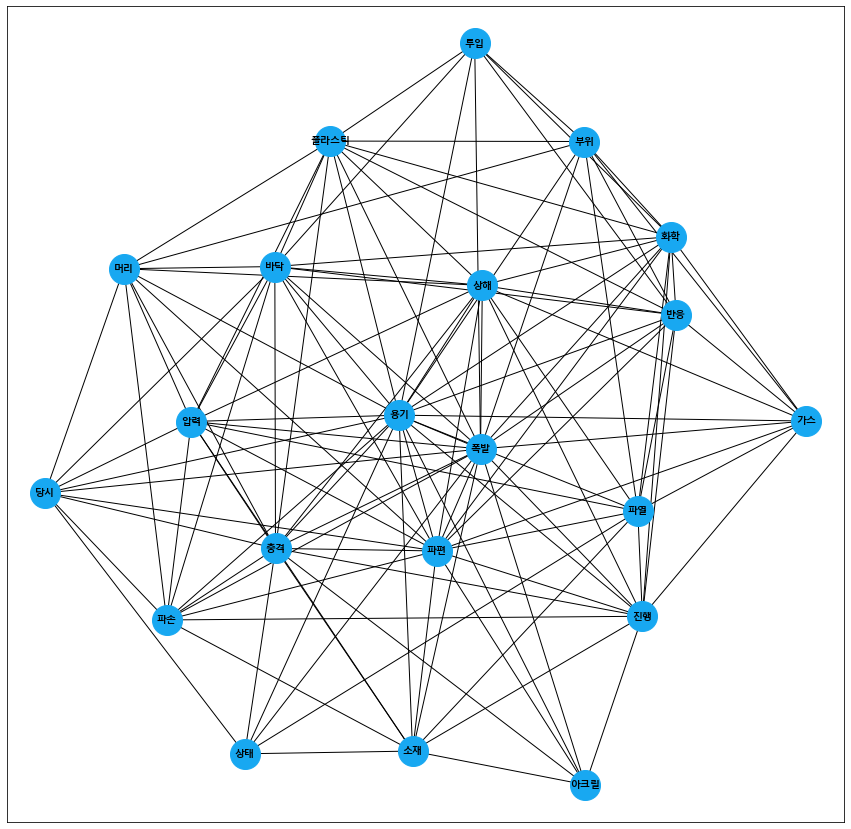

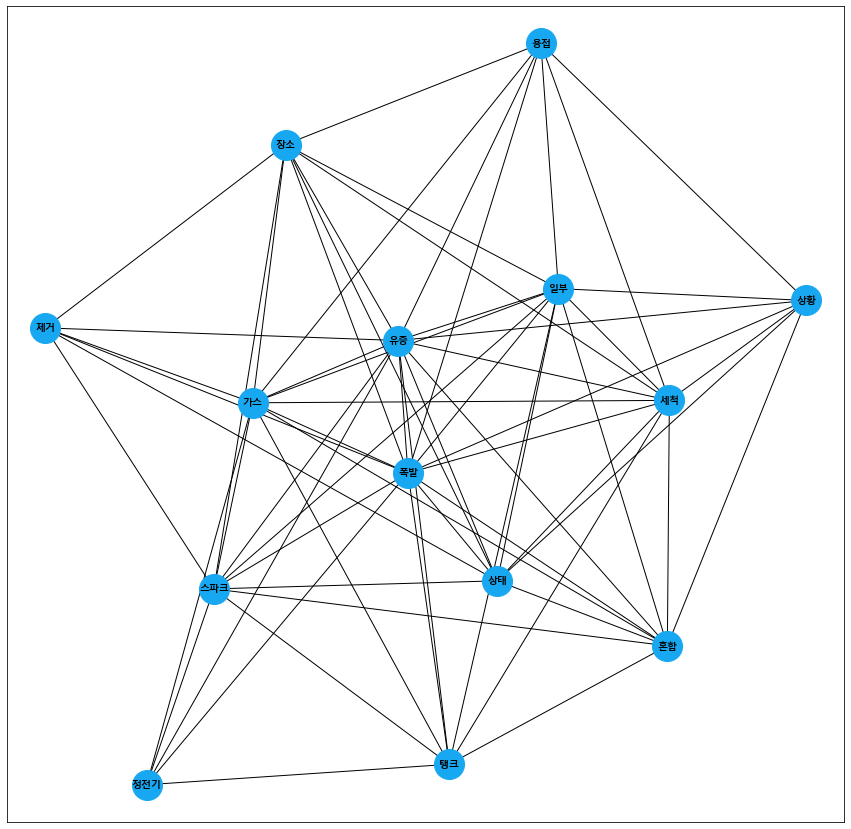

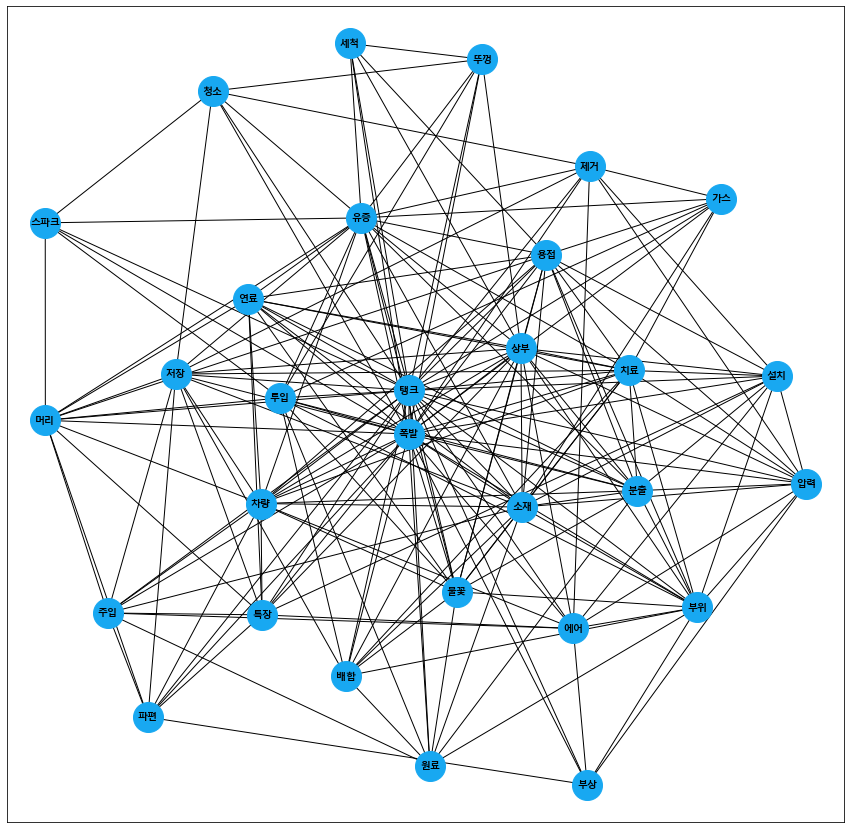

In [159]:
from collections import defaultdict
from networkx.algorithms.community import girvan_newman
from sklearn.feature_extraction.text import CountVectorizer

all_daf = []
min_df = 3
countv = CountVectorizer(
                         min_df=min_df # 최소 단어 등장 횟수
                        ,stop_words = list(df_stopwords.get("불용어"))
                        )
                             
for ci in range(n_clusters): # ci : cluster_index
    
    semi_cluster= all_cluster_sentence[ci] #cluster 별로 워드 임베딩 결과 필터링
    clean_cluster = drop_diplicate(semi_cluster)
    if len(clean_cluster)<=min_df:
        continue
#     semi_cluster.to_csv(sort_name+'_re_cluster'+str(ci)+'_re_DTM.csv',encoding='utf-8-sig') 
                                       
    sp_mat = countv.fit_transform(clean_cluster)


    # 희소행렬을 np array로
    count_df = pd.DataFrame(sp_mat.toarray(),columns = countv.get_feature_names())
    count_df.to_csv('./'+dir_name+'/폭발파열_DTM_cluster'+str(ci)+'.csv',encoding = 'utf-8-sig')

    # count Vector 기반 동시 단어 행렬
    count_df_transpose = count_df.transpose()
    count_df_transpose # 전치 행렬
    count_term_document_matrix = count_df_transpose.dot(count_df)  
                                       
    count_term_document_matrix.to_csv('./'+dir_name+'/폭발파열_동시단어출현_cluster'+str(ci)+'.csv',encoding='utf-8-sig') 

    
    #네트워크 시각화를 위한 input 데이터를 만드는과정 
    dic = {}
    dic['word'] = []
    dic['toword'] = []
    dic['count'] = [] 

    count = defaultdict(int)

    idx = 1
    for col in count_term_document_matrix.columns:
        for col2 in count_term_document_matrix.columns[idx:]:
            score=count_term_document_matrix.loc[col,col2]
            if score == 0 :
                continue
#             if score<=0.80:
#                 continue
            dic['count'].append(score)

            dic['word'].append(col)
            dic['toword'].append(col2)

            count[col]+=1
            count[col2]+=1
        idx+=1
    
    all_daf.append(dic)

    daf = pd.DataFrame(dic) # dic to dataframe
    
    g = nx.from_pandas_edgelist(daf,'word','toword',)
    
    plt.figure(figsize=(15, 15))
    pos = nx.spring_layout(g,weight='count',k=1*1/np.sqrt(len(g.nodes())), iterations=50)

    pos=nx.kamada_kawai_layout(g,
    #                            dist=(2,3),
                               weight='count',
                               scale=10,
                               center=(0,5),
                               dim=2,)
    
    import matplotlib.font_manager as fm
    font_name = fm.FontProperties(fname = 'C:/Windows/Fonts/malgunbd.ttf').get_name()
    
    nx.draw_networkx(g, with_labels = True,
                     pos = pos,
                     node_color='#18A8F1',
                     node_size = 900,
                     font_color ='black',
                     font_weight ='bold',
                     font_size =10,
                     font_family = font_name)
    # (g,pos,node_size=[800], node_color='pink', font_size=12,font_family='AppleGothic',)

    plt.savefig('./'+dir_name+'/폭발파열_cluster'+str(ci)+'.png')

# plt.show()



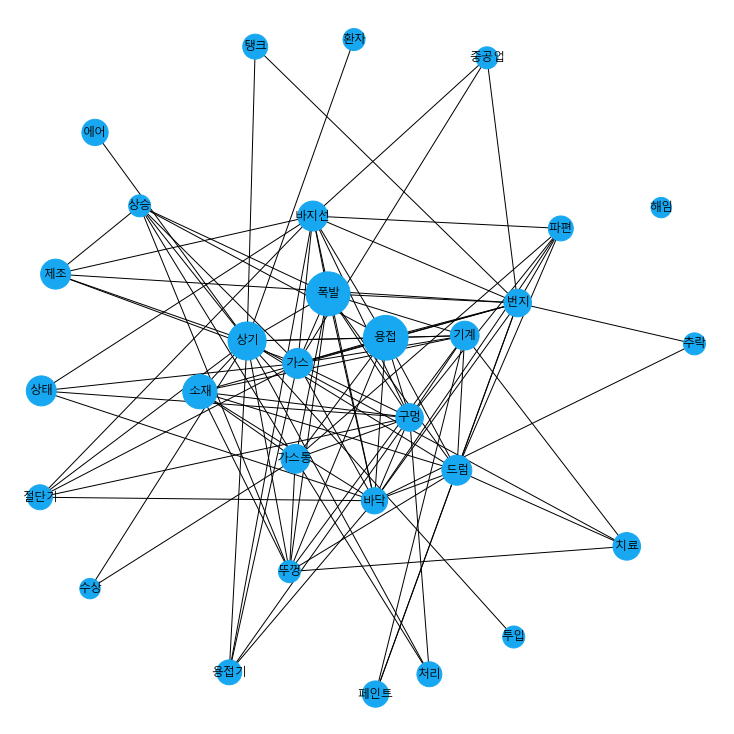

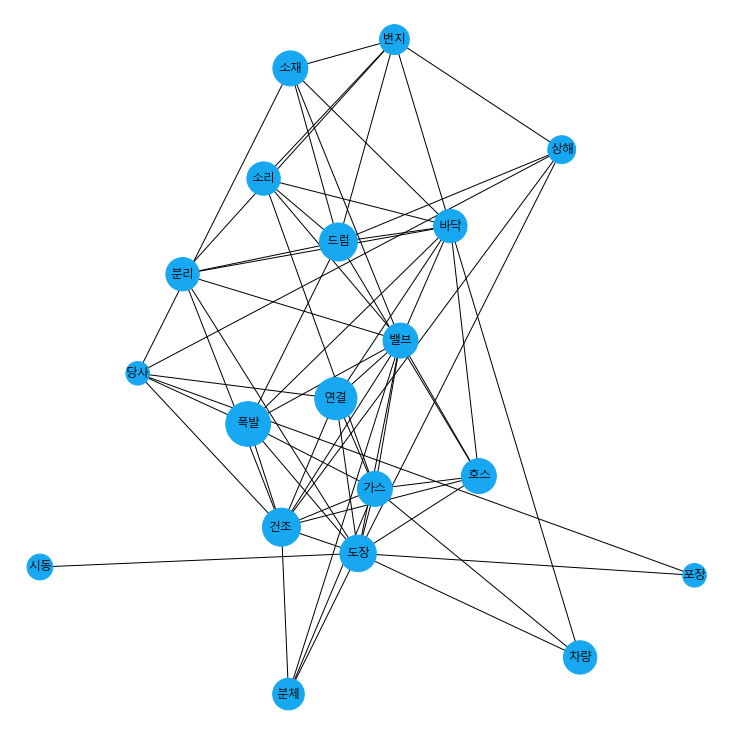

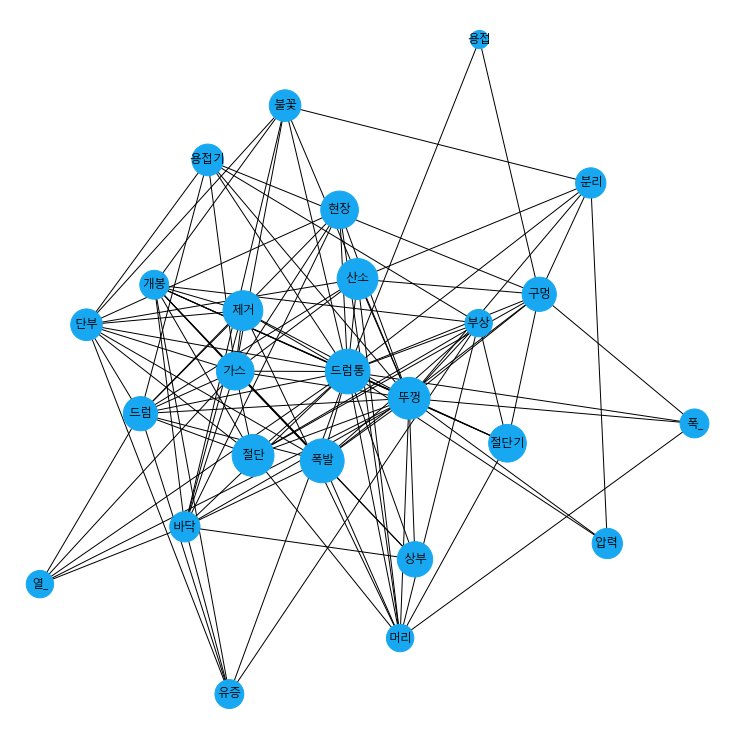

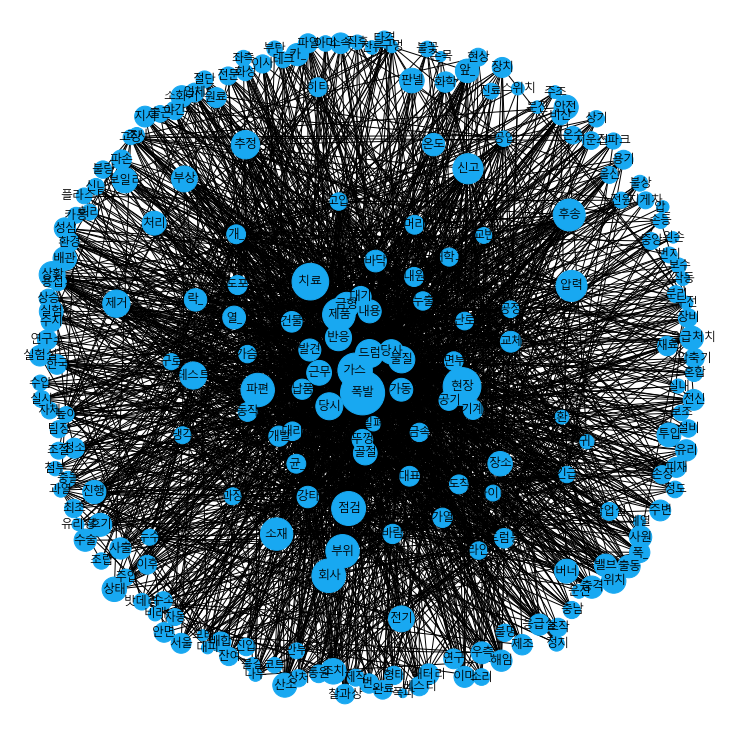

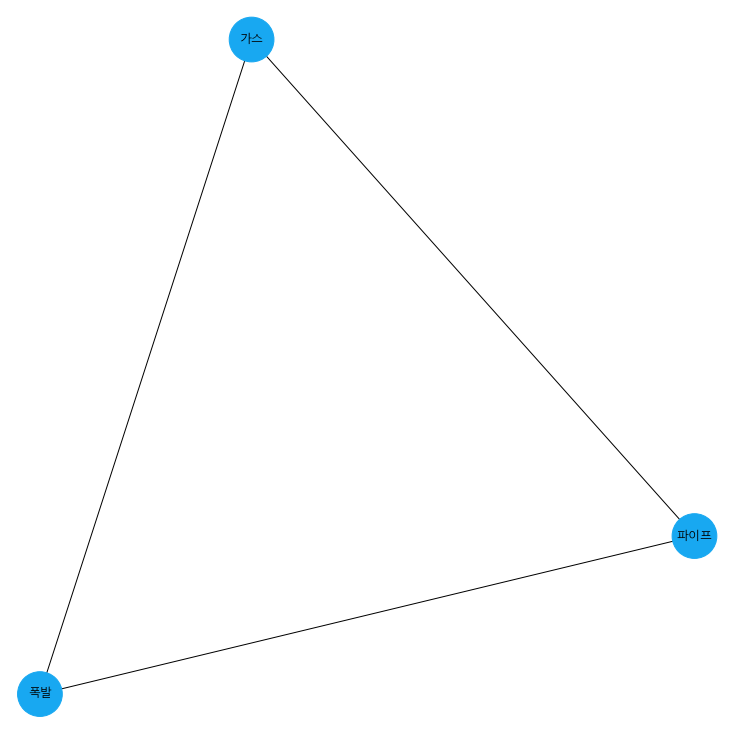

...

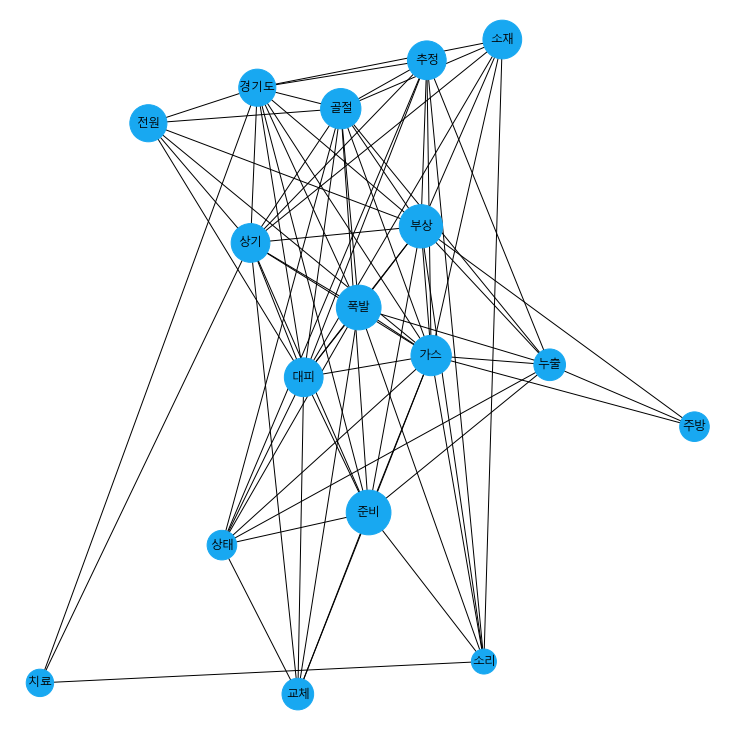

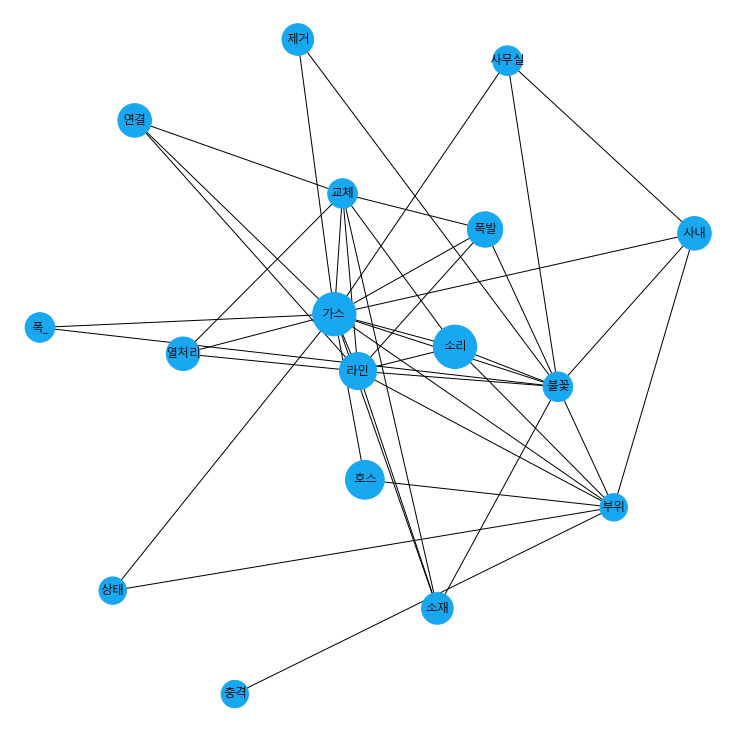

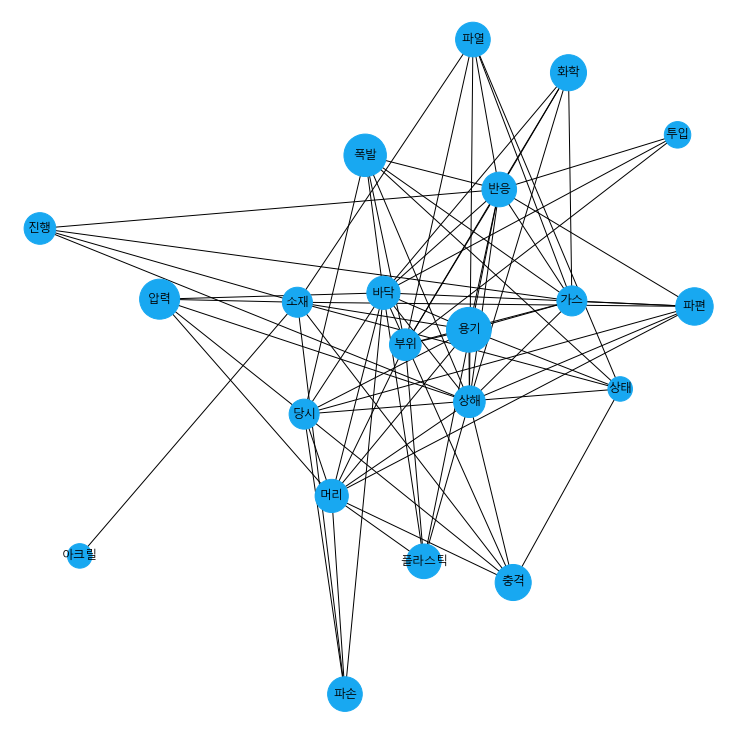

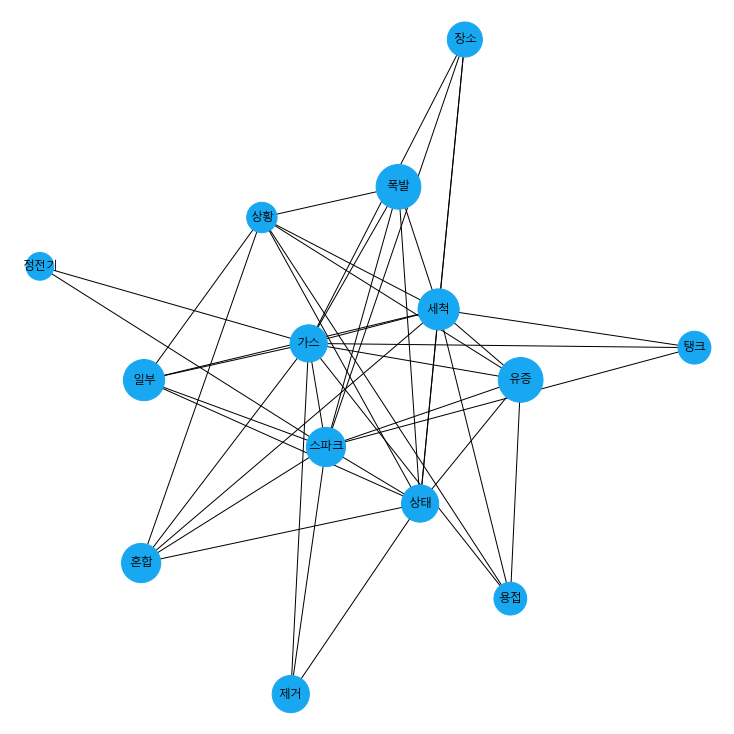

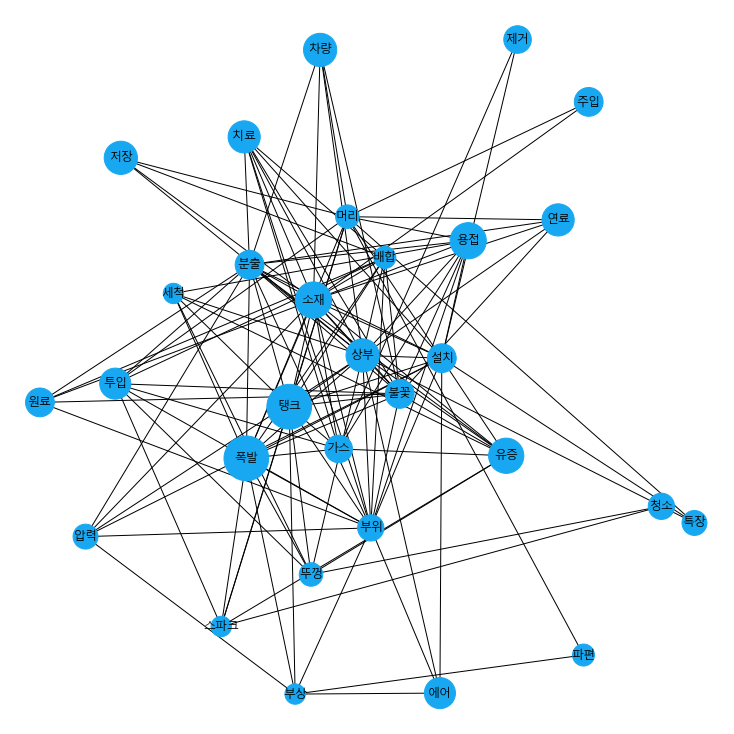

In [160]:
# -*- encoding: utf-8 -*-
import pandas as pd
import networkx as nx
import operator
import numpy as np

for ci in range(len(all_daf)):
    

    daf = pd.DataFrame(all_daf[ci]) # dic to dataframe
    
    # 단어쌍 동시출현 빈도수를 담았던 networkx.csv파일을 불러온다.

    # 중심성 척도 계산을 위한 Graph를 만든다
    G_centrality = nx.Graph()
    
#     g = nx.from_pandas_edgelist(daf,'word','toword',)

    # 빈도수가 1이상인 단어쌍에 대해서만 edge(간선)을 표현한다.
    for ind in range((len(np.where(daf['count'] >= 1)[0]))):
        G_centrality.add_edge(daf['word'][ind], daf['toword'][ind], weight=int(daf['count'][ind]))

    dgr = nx.degree_centrality(G_centrality)        # 연결 중심성
    btw = nx.betweenness_centrality(G_centrality)   # 매개 중심성
    cls = nx.closeness_centrality(G_centrality)     # 근접 중심성
    egv = nx.eigenvector_centrality(G_centrality)   # 고유벡터 중심성
    pgr = nx.pagerank(G_centrality)                 # 페이지 랭크

    # 중심성이 큰 순서대로 정렬한다.
    sorted_dgr = sorted(dgr.items(), key=operator.itemgetter(1), reverse=True)
    sorted_btw = sorted(btw.items(), key=operator.itemgetter(1), reverse=True)
    sorted_cls = sorted(cls.items(), key=operator.itemgetter(1), reverse=True)
    sorted_egv = sorted(egv.items(), key=operator.itemgetter(1), reverse=True)
    sorted_pgr = sorted(pgr.items(), key=operator.itemgetter(1), reverse=True)

    # 단어 네트워크를 그려줄 Graph 선언
    G = nx.Graph()

    # 페이지 랭크에 따라 두 노드 사이의 연관성을 결정한다. (단어쌍의 연관성)
    # 연결 중심성으로 계산한 척도에 따라 노드의 크기가 결정된다. (단어의 등장 빈도수)
    for i in range(len(sorted_pgr)):
        G.add_node(sorted_pgr[i][0], nodesize=sorted_dgr[i][1])

    for ind in range((len(np.where(daf['count'] > 1)[0]))):
        G.add_weighted_edges_from([(daf['word'][ind], daf['toword'][ind], int(daf['count'][ind]))])
        
    plt.figure(figsize=(10, 10))

    # 노드 크기 조정
    sizes = [G.nodes[node]['nodesize'] * 2000 for node in G]

    options = {
        'edge_color': '#000000',
        'width': 1,
        'with_labels': True,
        'font_weight': 'regular',
    }

    # 폰트 설정을 위한 font_manager import
    import matplotlib.font_manager as fm
    import matplotlib.pyplot as plt

    # 폰트 설정
    fm._rebuild()		# 1회에 한해 실행해준다. (폰트 새로고침, 여러번 해줘도 관계는 없다.)
    font_fname = 'C:/Windows/Fonts/malgunbd.ttf'      # 여기서 폰트는 C:/Windows/Fonts를 참고해도 좋다.
    fontprop = fm.FontProperties(fname=font_fname, size=30).get_name()

    nx.draw(G, node_color = "#18A8F1", node_size=sizes, pos=nx.spring_layout(G, k=3.5, iterations=100), **options, font_size =12, font_family=fontprop)  # font_family로 폰트 등록
    ax = plt.gca()
    ax.collections[0].set_edgecolor("#18A8F1")
    
    plt.savefig('./'+dir_name+'/폭발파열_중심성분석_cluster'+str(ci)+'.png')
    plt.show()